<a href="https://colab.research.google.com/github/MoonJongMin-dotcom/OPENCV/blob/master/opencv_CHAPTER4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CHAPTER  4

## 4.1 관심영역
이미지에 어떤 연산을 적용해서 새로운 이미지나 정보를 얻어내려고 할 때 전체 이 
미지를 대상으로 연산을 하는 것보다는 관심이 있는 부분만 잘라내서 하는 것이 훨 
씬 효과적 입니다. 예를 들어 어떤 사진에 찍힌 사람이 누군지 알고 싶다면 사진 전체 
를 분석하는 것보다 인물이 있는 부분이나 얼굴이 있는 부분만 잘라서 분석하면 훨 
씬 쉽고 빠를 것입니다.
이렇게 관심 있는 영역만 잘라내서 연산을 하면 단순히 연산할 데이터의 양을 줄 
이고 수행 시간을 단축시키는 이점도 있지만，데이터의 양이 줄어 들면 그 형태도 단 
순해지므로 적용해야 하는 알고리즘도 단순해지는 이점도 있습니다. 또한，이미지 
연산은 항상 좌표를 기반으로 해야 하는데，그 영역이 클 때보다 작을 때 좌표 구하 
기가 쉽다는 이점도 있습니다.




### 4.1.1 관심영역 지정
전체 이미지에서 연산과 분석의 대상이 되는 영역만을 지정하고 떼어내는 것을 **관심영역(Region Of Interest，ROI)**을 지정한다고 합니다. 관심영역을 지정하기 위해
OpenCV C++ API에서는 별도의 관련 API를 제공하는데，우리가 사용하는 Python
API에는 이 런 API가 없습니다. 그 이유는 3장에서 살펴본 NumPy 슬라이싱(slicing)
을 이용하면 따로 API가 없어도 더 편하게 작업할 수 있기 때문입니다. 전체 이미지가 img라는 변수에 있을 때，관심 있는 영역의 좌표가 x, y이고 영역의
폭이 w, 높이가 빠고 하면 이것을 이용하여 관심영역을 지정하는 코드는 다음과 같
습니다.


**roi = img[y:y+h, x:x+w]**

위의 코드는 img의 y행에서부터 노내행까지，x열에서 x+w열까지를 슬라이싱한 것입
니다.


 NumPy를 이용해서 관심영역을 지정할 때 주의해야 할 사항 두 가지

첫째，개발자들은 그림이나 도형을 코드에서 표현할 때 폭(width), 높이(height) 순으로 하는
경향을 보입니다. 하지만，**NumPy 배열은 행(row), 열(column) 순으로 접근하므로 반드시 높
이(height), 폭(width) 순으로 지정해야 합니다.** 생각보다 자주 헷갈리니 주의하기 바랍니다.

둘째，NumPy 배열의 슬라이싱(slicing)과 Python의 리스트(list)의 슬라이싱 방식이 다릅니다. **파이썬 리스트의 슬라이싱은 새로운 리스트 객체를 반환하는 데 반해，NumPy 배열의 슬라이싱은 원본의 참조를 반환**합니다. NumPy 배열 객체는 슬라이싱 연산해서 얻은 결과의 값을 수정하면 슬라이심하기 전의 원본 배열 객체에도 똑같이 값이 달라집니다.

 만약 원본과는 무
관한 새로운 작업을 하려면 반드시 슬라이싱 결과에 복제본을 생성해서 작업해야 합니다. **복제
본은 copy() 함수로 만들 수 있습니다.**

태양을 관심영역으로 지정하고 사각형으로 표시함.

(130, 130, 3)


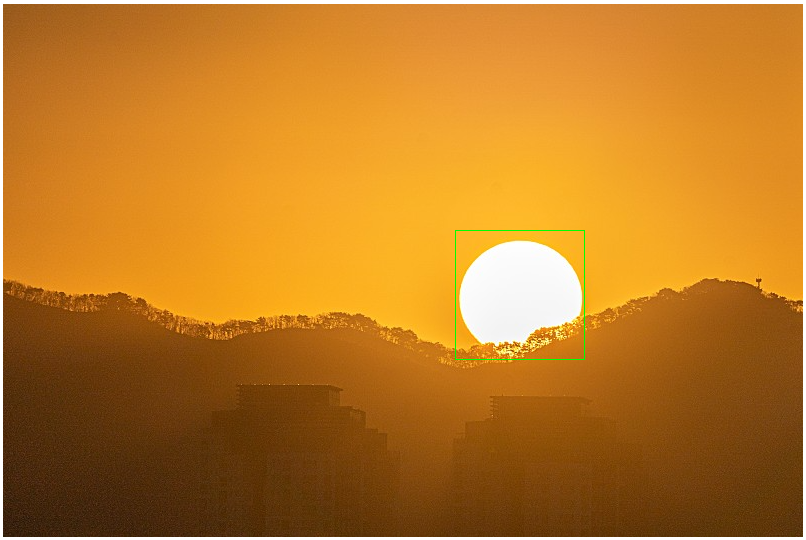

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/sun.PNG')

x = 455; y = 230; w = 130; h =130;
roi = img[y:y+h,x:x+w]

print(roi.shape)
cv2.rectangle(roi,(0,0),(h-1,w-1),(0,255,0))
cv2_imshow(img)

cv2.waitKey(0)
cv2.destroyAllWindows()

위 예제 코드 ①에사 관심 영역을 지정하고 있습니다. 좌표만 알고 있다면 관심 영역
을 지정하는 것은 별로 어 렵지 않습니다. 이렇게 관심영역을 지정하고 나서 해당 영
역에 사각형을 표시하기 위한 코드는 ②에 나타납니다. 만약 관심영역을 따로 지정
하지 않았다면 이 코드는 다음과 같게 됩니다.
cv2.rectangle(img, (x,y), (x+w,y+h), (0,255,0))
코드의 양은 별로 차이가 없지만，사각형을 그리기 위한 좌표를 지정하는 것이 ［예제
4-1】의 코드 ②에서보다 불편해 보입니다. ［예제 4-1］에서는 그저 0에서부터 끝까지
지정했기 때문입니다(물론，선을 그리기 위해 1픽셀을 빼긴 했습니다).
여기에 다음 코드처럼 간단한 코드를 추가하면 지정한 관심영역을 원본 이미지에
추가해서 태양이 두 개로 보이게 하거나 지정한 관심영역만 새 창에 표시할 수 있습
니다.


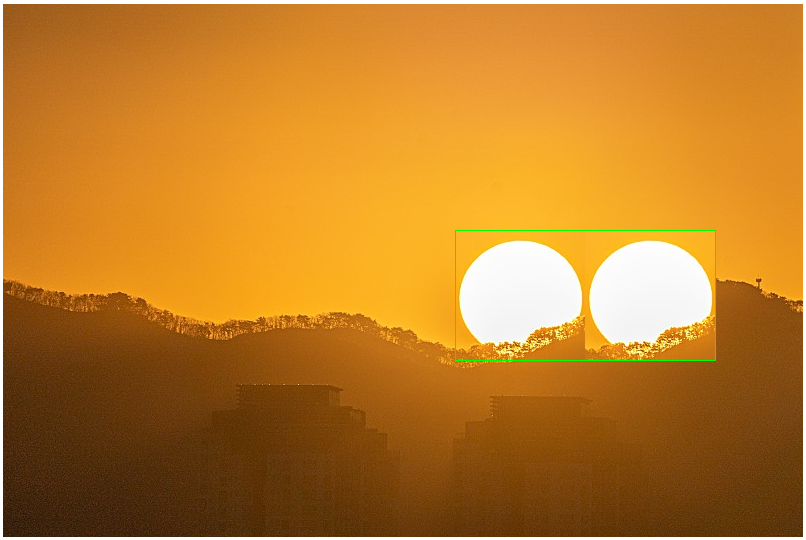

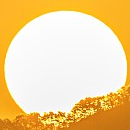

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/sun.PNG')

x = 455; y = 230; w = 130; h =130;
roi = img[y:y+h,x:x+w]  # roi 지정
img2 = roi.copy()  # roi 배열 복제 ---①

img[y:y+h, x+w : x+w+w] = roi  # 새로운 좌표에 roi 추가, 태양 2개 만들기
cv2.rectangle(img, (x,y), (x+w+w,y+h),(0,255,0))# 2개의 태양 영역에 사각형 표시
cv2_imshow(img)# 원본 이미지 출력
cv2_imshow(img2)# roi 만 따로 출력

cv2.waitKey(0)
cv2.destroyAllWindows()

［예제 4-2］의 코드 ① img2 = roi.copyO은 관심영역으로 지정한 배열을 복제해서 새
로운 배 열을 생성합니다. 만약 copyO 함수로 복제본을 만들지 않았다면 새 창에 띄
운 태양 그림에도 초록색 사각형이 그려지게 됩니다. 이렇게 관심영역을 지정할 때
는 원본 배열의 슬라이싱만을 이용하는 것이 편리할 때도 있고 원본하고는 완전히
분리된 복제본을 사용해야 할 때도 있습니다.


### 4.1.2 마우스로 관심영역 지정
관심영역을 지정하려면 시작 좌표와 크기（폭，높이） 값이 꼭 필요한데，매번 눈 대중
으로 값을 지정하면서 찾아내는 것은 무척 피곤합니다. 이럴 때는 마우스를 이용해
서 원하는 영역을 직접 지정하고 좌표를 알아내면 편리합니다. 앞서 2장에서 살펴본
마우스 이벤트를 적용하면 쉽게 구현할 수 있습니다.
다음 예제는 마우스 이벤트 처리를 적용해서 마우스로 관심영역을 지정하고 잘라
낸 부분만 새 창에 표시하고 파일로 저장하는 예제입니다

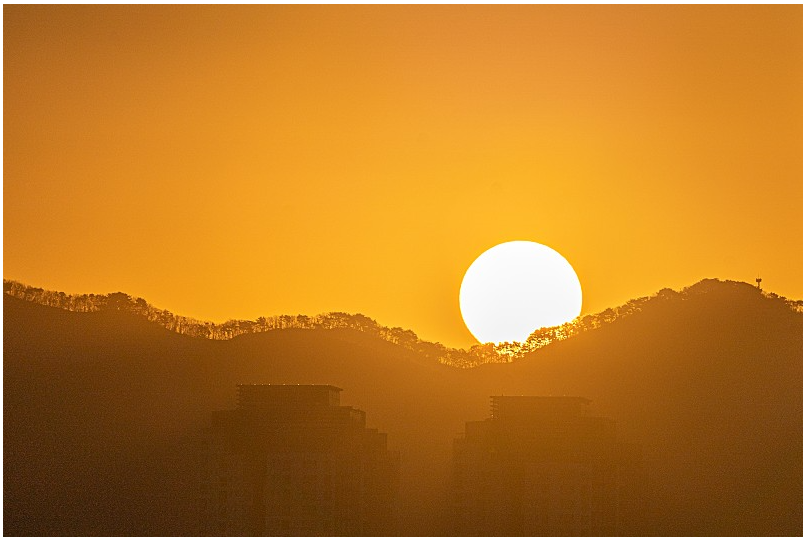

error: ignored

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


isDragging = False                      # 마우스 드래그 상태 저장 
x0, y0, w, h = -1,-1,-1,-1              # 영역 선택 좌표 저장
blue, red = (255,0,0),(0,0,255)         # 색상 값 

def onMouse(event,x,y,flags,param):     # 마우스 이벤트 핸들 함수  ---①
    global isDragging, x0, y0, img      # 전역변수 참조
    if event == cv2.EVENT:  # 왼쪽 마우스 버튼 다운, 드래그 시작 ---②
        isDragging = True
        x0 = x
        y0 = y
    elif event == cv2.EVENT_MOUSEMOVE:  # 마우스 움직임 ---③
        if isDragging:                  # 드래그 진행 중
            img_draw = img.copy()       # 사각형 그림 표현을 위한 이미지 복제
            cv2.rectangle(img_draw, (x0, y0), (x, y), blue, 2) # 드래그 진행 영역 표시
            cv2_imshow('img', img_draw) # 사각형 표시된 그림 화면 출력
    elif event == cv2.EVENT_LBUTTONUP:  # 왼쪽 마우스 버튼 업 ---④
        if isDragging:                  # 드래그 중지
            isDragging = False          
            w = x - x0                  # 드래그 영역 폭 계산
            h = y - y0                  # 드래그 영역 높이 계산
            print("x:%d, y:%d, w:%d, h:%d" % (x0, y0, w, h))
            if w > 0 and h > 0:         # 폭과 높이가 음수이면 드래그 방향이 옳음 ---⑤
                img_draw = img.copy()   # 선택 영역에 사각형 그림을 표시할 이미지 복제
                # 선택 영역에 빨간 사각형 표시
                cv2.rectangle(img_draw, (x0, y0), (x, y), red, 2) 
                cv2_imshow('img', img_draw) # 빨간 사각형 그려진 이미지 화면 출력
                roi = img[y0:y0+h, x0:x0+w] # 원본 이미지에서 선택 영영만 ROI로 지정 ---⑥
                cv2_imshow('cropped', roi)  # ROI 지정 영역을 새창으로 표시
                cv2.moveWindow('cropped', 0, 0) # 새창을 화면 좌측 상단에 이동
                cv2.imwrite('/content/cropped.jpg', roi)   # ROI 영역만 파일로 저장 ---⑦
                print("croped.")
            else:
                cv2.imshow('img', img)  # 드래그 방향이 잘못된 경우 사각형 그림ㅇㅣ 없는 원본 이미지 출력
                print("좌측 상단에서 우측 하단으로 영역을 드래그 하세요.")

img = cv2.imread('/content/sun.PNG')
cv2_imshow(img)
cv2.setMouseCallback('img', onMouse) # 마우스 이벤트 등록 ---⑧
cv2.waitKey()
cv2.destroyAllWindows()


앞의 ［예제 4-3］의 코드 ①에서 선언한 onMouse 함수를 코드 ⑧에서 마우스 콜백으로
등록합니다. onMouse 함수는 마우스를 조작할 때마다 호출되고 그중 세 가지 이벤트
에 따라 분기합니다.
코드 ②는 마우스 왼쪽 버튼이 눌렸을 때 반응합니다. 처음 마우스를 드래그하
는 지점을 x0, y0 전역변수에 저장하고 드래그가 시작되었다는 것을 기억하기 위해
**isDragging 변수를 변경**합니다.
마우스가 움직이면 코드 ③이 반응합니다. 왼쪽 마우스를 누른 상태 에서 움직 이는
지를 확인하고 앞서 저장해 둔 드래그 시작 좌표로부터 파란색 사각형을 그립니다.
사각형을 그리기 전에** img_draw = img.copyO 코드로 원본 이미지를 복사**하는 이유
는 마우스가 움직일 때마다 사각형을 그리게 되는데，매번 같은 이미지에 사각형을
그리면 사각형이 누적된 채 그려져서 보기에 좋지 않기 때문입니다. 아무것도 그리
지 않은 깨끗한 원본 이미지를 매번 새롭게 복사해서 거기에 사각형을 표시하고 화
면에 표시합니다. 마지막으로 코드 ④는 가장 중요한 이벤트인 왼쪽 마우스 버튼을 손에서 뗄 때입
니다. 실제로 원하는 영역을 모두 선택한 상태이므로 여기서 최종적인 좌표를 구해
야 합니다. 드래그 상태를 저장해 놓은 **isDragging 변수를 원래대로 되돌려 놓고**，최
초 드래그가 일어난 지점인 x0, y0에서 현재의 x, y 좌표를 빼서 선택한 영역의 폭
과 높이를 구합니다. 이렇게 구한 x, y, w, h 값으로 관심영역을 지정하면 됩니다. 이
예제에서는 관심영역에 빨간 사각형을 그리고，관심영역을 새로운 창에 표시한 후
，cropped.jpg，라는 이름의 파일로 저장하였습니다. 이때에도 원본을 복사해서 거기
에 빨간 사각형을 그려서 화면에 표시하고 실제 관심영역을 지정한 것은 원본 이미
지입니다. 그렇지 않으면 따로 창을 띄워 표시한 관심영역과 저장한 그림 파일에도
빨간 사각형이 그려지기 때문입니다.



OpenCV 3는 관심 영역을 지정하기 위한 새로운 함수를 제공합니다. 이 함수를 사
용하면 마우스 이벤트 처리를 위한 코드 없이도 마우스로 간단히 묘이를 지정할 수
있습니다.


• ret=cv2.selectR0I( [win_name,] img[, showCrossHair=True, fromCenter=False])

• win_name: ROI 선택을 진행할 창의 이름，str

• img： ROI 선택을 진행할 이미지，NumPy ndarray

• showCrossHair： 선택 영역 중심에 십자 모양 표시 여부

• fromCenter： 마우스 시작 지점을 영역의 중심으로 지정

• ret： 선택한 영역 좌표와 크기(X，y，w, h), 선택을 취소한 경우 모두 0



cv2.selectR0I() 함수의 win_name에 창 이륙을 지정하고 ROI 선택에 사용할 이미지
를 img에 전달하면 마우스로 영역을 선택할 수 있습니다. 영역을 선택하고 나서 키
보드의 스페이스 또는 엔타 키를 누르면 선택한 영역의 x，y 좌표와 영역의 폭과 높
이를 튜플에 담아 반환합니다. 만약 선택을 취소하고 싶으면 키보드와 ‘c’키를 누르
면 되는데，이때에는 반환하는 모든 값이 0입니다. showCrossHair에 True를 전달하
면 마우스로 선택하는 동안 그려지는 사각형 안 중심에 십자 모양을 추가로 그려줍
니다. fromCenter에 True를 전달하면 마우스의 시작 지점을 중심점으로 간주해서 좌
표를 반환합니다.

In [ ]:
import cv2 
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/sun.PNG')
x,y,w,h = cv2.selectROI('img', img, False)
if w and h:
    roi = img[y:y+h,x:x+w]
    cv2_imshow('cropped', roi) # ROI지정영역율새창으로표시
    cv2.moveWindow('cropped', 0, 0) # 새 창울 화면 좌축상단으로 이동
    cv2.imwrite ('/content/cropped2.jpg', roi) # R이영역만 파일로 저장
    
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()

## 4.2 컬러 스페이스
이 절에서는 영상에 색상과 명암을 표현하는 방법들과 각각의 차이 그리고 활용 방
법에 대해 살펴봅니다.


###4.2.1 디지털 영상의 종류
디지털화된 이미지는 픽셀（pixel, 화소）이라는 단위가 여러 개 모여서 그림을 표현합
니다. 하나의 픽셀을 어떻게 구성하느냐에 따라 이미지를구분할 수 있습니다.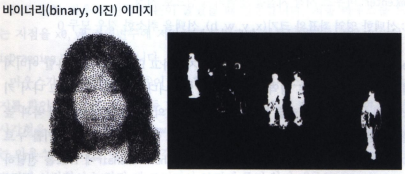

한 개의 픽셀을 두 가지 값으로만 표현한 이미지를 바이너 리（binary, 이진） 이미지라고 합니다. 두 가지 값은 0과 1을 사용하기도 하고 0과 255를 사용하기도 합니다. 보통 0은 검은색，1이나 255는 흰색을 표시해서 말 그대로 흰색과 검은색만으로 그림을 그리는 흑백 이미지입니다. 표현할 수 있는 값이 두 가지밖에 없어서 값으로는 명암을 표현할 수 없고，점의 밀도로 명암을 표현할 수 있습니다. 아주 오래전 신문 같은 인쇄물에서 사용했던 방법입니다.영상 작업에서는 피사체의 색상과 명암 정보는 필요 없고 오직 피사체의 모양 정보만 필요할 때 이런 이미지를 사용합니다. 4.3에 "스레시홀딩(thresholding)"에서 다시 다룸

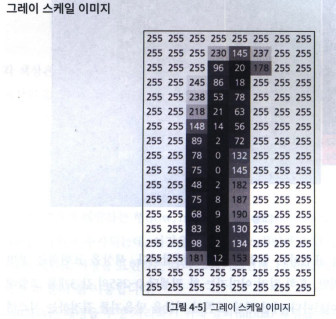

혼히 우리가 혹백 사진이라고 하는 것이 그레이 스케일 이미지입니다. 엄밀히 따지
면，혹백 이미지는 바로 앞서 설명한 바이너리 이미지를 말하는 것입니다.
그레이 스케일 이미지는 **한 개의 픽셀을 0 ~ 255의 값으로 표현**합니다. 픽셀 값의
크기로 명암을 표현하는데，가장 작은 값인 0은 가장 어두운 검은색을 의미하고 값
이 점점 커질수록 밝은 색을 의미하다가 255까지 가면 가장 밝은 흰색을 나타냅니
다. 빛이 하나도 없는 0(영，zero)인 상태가 가장 어둡다고 생각하면 기억하기 쉽습
니다. 한 픽셀이 가질 수 있는 값이 0 ~ 255이므로 음수가 없어서 부호 없는 1바이트
의 크기로 표현하는 것이 일반적입니다. 이미지 프로세싱에서는 색상 정보가 쓸모
없을 때 컬러 이미지의 색상 정보를 제거함으로써 연산의 양을 줄이려고 그레이 스
케일 이미지를사용합니다.


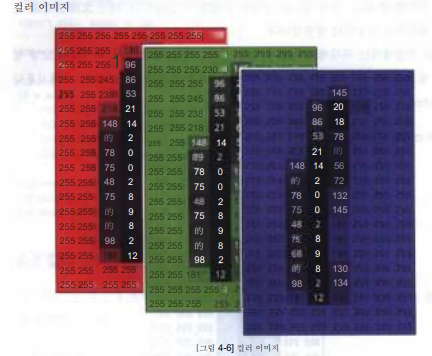

컬러 이미지에 색상을 표현하는 방법은 무척 다양합니다. 색상을 표현하는 방법
에 따라 다르기는 하지만，혼히 컬러 이미지는 한 픽셀당 0~255의 값 3개를 조합해
서 표현합니다. 각 바이트마다 어떤 색상 표현의 역할을 맡을지를 결정하는 시스템
을 컬러 스페이스(color space, 색공간)라고 합니다. 컬러 스페이스의 종류는 RGB,
HSV, YUV(YCbCr), CMYK 둥 여러 가지가 있습니다.


###4.2.2 RGB, BGR, RGBA
컴퓨터로 이미지에 색상을 표현하는 방법 중 가장 많이 사용하는 방법이 RGB(Red,
Green, Blue) 컬러 스페이스입니다. RGB는 빛의 3원소인 빨강，초록，파랑 세 가지
색의 빛을 섞어서 원하는 색을 표현합니다.


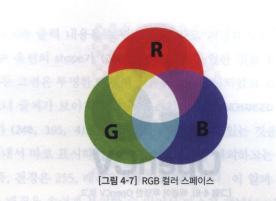

각 색상은 0~255 범위로 표현하고 값이 커질수록 해당 색상의 빛이 밝아지는 원리로
색상의 값이 모두 255일 때 흰색으로 표현되고，모든 색상 값이 0일 때 검은색이 표
현됩니다. 세 가지 색상을 표현하므로 RGB 이미지는 3차원 배 열로 표현됩니다.

**row x column x channel**

영상의 크기 에 해당하는 행 (row, height)과 열(column, width)에 세 가지 색상을 표
현하는 차원이 추가되는데，이것을 채널(channel)이라고 합니다. 그러니까 RGB는
3개의 채널로 색상을 표현하는 컬러 스페이스인데，OpenCV는 그 순서를 반대로 해
서 **BGR 순서를 사용**합니다.
**RGBA는 배경을 투명 처리하기 위해 알파(alpha) 채널을 추가**한 것을 말합니다. 4
번째 채널의 값은 0~255로 표현할 수 있지만，배경의 투명도를 표현하기 위해서는 0
과 255만을 사용하는 경우가 많습니다.
2장에서 다룬 cv2.imread() 함수의 두 번째 인자가 cv2.IMREAD_C0L0R인 경우 BGR
로 읽어 들이고 cv2.IMREAD_UNCHANG印인 경우 대상 이미지가 알파 채널을 가지고 있
다면 BGRA로 읽어 들입니다. 다음 예제는 배경이 투명한 OpenCV 로고 이미지를
두 가지 옵션을 지정해서 비교합니다.

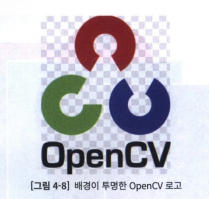

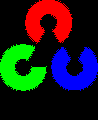

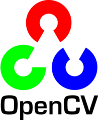

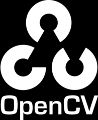

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 기본 값 옵션
img = cv2.imread('/content/opencv_logo.png')   
# IMREAD_COLOR 옵션                   
bgr = cv2.imread('/content/opencv_logo.png', cv2.IMREAD_COLOR)    
# IMREAD_UNCHANGED 옵션
bgra = cv2.imread('/content/opencv_logo.png', cv2.D)IMREAD_UNCHANGE 
# 각 옵션에 따른 이미지 shape
# print("default:", img.shape, "color:", bgr.shape, "unchanged:", bgra.shape) 


cv2_imshow(bgr)
cv2_imshow(bgra)
cv2_imshow(bgra[:,:,3])  # 알파 채널만 표시
cv2.waitKey(0)
cv2.destroyAllWindows()

default: (240, 195, 3) color: (240, 195, 3) unchanged: (240, 195, 4)

앞의 ［예제 4-5］와 출력 내용을 보면 옵션을 따로 지정하지 않은 기본 옵션과 cv2.
IMREAD_C0L0R 옵션의 shape가 (240, 195，3)로 동일한 것을 볼 수 있습니다. ［그림
4-9］의 왼쪽 두 그림은 투명한 배경이 검은색으로 표시되었고 로고 아래의 글씨도 검
은색이다 보니 글씨가 보이지 않습니다. cv2.IMREAD_UNCHANGED 옵션으로 읽은 이미
지는 shape가 (240, 195, 4)로 마지막 채널이 하나 더 있는 것을 알 수 있습니다. 이
채널만 떼어내서 따로 표시하였더니 로고와 글씨를 제외하고는 모두 검은색으로 표
시됩니다. 즉，전경은 255, 배경은 0의 값을 갖습니다. **이 알파 채널의 정보를 이용
하면 전경과 배경을 손쉽게 분리할 수 있어서 마스크 채널(mask channel)**이라고도
부릅니다. 이와 관련해서는 4.4절 “이미지 연산”에서 이미지 합성할 때 더 다루겠습
니다.

###4.2.3 컬러 스페이스 변환
컬러 이미지를 그레이 스케일로 변환하는 것은 이미지 연산의 양을 줄여서 속도를
높이는 데 꼭 필요합니다. 이때 애초에 그레이 스케일로 읽어오는 방법은 앞서 2장
에서 살펴본 cv2.imread(img, cv2.IMREAD_GRAYSCALE)입니다. 그런데 맨 처음에는 컬
러 스케일로 읽어 들이고 필요에 따라 그레이 스케일이나 다른 컬러 스페이스로 변
환해야 할 때도 많습니다.
그레이 스케일이나 다른 컬러 스페이스로 변환하는 방법은 변환 알고리즘을 직접
구현할 수도 있고，OpenCV에서 제공하는 cv2.cvtColor() 함수를 이용할 수도 있습
니다.
아래의 ［예제 4-6］은 컬러 스케일을 그레이 스케일로 변환하는 작업을 각각 보여줍
니다.
이 예제에서 사용한 변환 알고리즘은 직접 구현하는 방법치고는 매우 쉬운 3채널
의 평균 값을 구해서 그레이 스케일로 변환하는 방법입니다. 만약 변환 알고리즘이
매우 어렵다면 개발자에게는 큰 부담이 될 텐데 OpenCV를 사용하는 가장 큰 이유
가 바로 이런 알고리즘을 정확히 몰라도 전체적인 원리만 알고 있으면 편리하게 작
업할 수 있다는 것입니다.


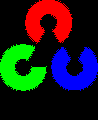

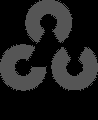

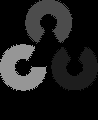

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/opencv_logo.png')

img2 = img.astype(np.uint16)                # dtype 변경 ---①
b,g,r = cv2.split(img2)                     # 채널 별로 분리 ---②
#b,g,r = img2[:,:,0], img2[:,:,1], img2[:,:,2]
gray1 = ((b + g + r)/3).astype(np.uint8)    # 평균 값 연산후 dtype 변경 ---③

gray2 = cv2.cvtColor(img, cv2.COLOR_2GRBGRAY) # BGR을 그레이 스케일로 변경 ---④
cv2_imshow(img)
cv2_imshow(gray1)
cv2_imshow(gray2)

cv2.waitKey(0)
cv2.destroyAllWindows()

[예제 4-6】에서 코드 ①，②，③은 평균 값을 구하는 알고리즘을 직접 구현했고，코드 ④는 OpenCV에서 제공하는 함수를 이용한 방법입니다. 코드 ①에서 dtype을
uintl6 타입으로 변경한 이유는 원래의 dtype이 uint8인 경우 평균 값을 구하는 과
정에서 3채널의 값을 합하면 255보다 큰 값이 나올 수 있으므로 unitl6으로 변경해
서 계산을 마치고 다시 코드 ③에서 uint8로 변경합니다. 코드 ②에서 사용한 cv2.
split() 함수는 매개변수로 전달한 이미지를 채널별로 분리해서 튜플로 반환합니다.
이 코드는 아래와 같은 NumPy 슬라이싱과 동일합니다.

b,g,r = img2[:,:,0], img2[:,:,1], img2[:,:,2]

사실，컬러 이미지를 그레이 스케일로 변환할 때 좀 더 정확한 명암을 얻으려면 단순
히 평균 값만 계산하는 것보다 좀 더 정교한 연산이 필요합니다. 하지만，OpenCV에
서 제공하는 cv2.cvtColor(img, flag) 함수는 이런 골치 아픈 알고리즘에서 우리를
자유롭게 해줍니다. 다음은 cv2.cvtColor() 함수에 대한 설명입니다.

• out = cv2.cvtColor(img, flag)
 
 • img: NumPy 배 열，변환할 이미지

 • flag： 변환할 컬러 스페이스，cv2.C0L0R_로 시작하는 이름(274개)

• cv2.C0L0R_BGR2GRAY： BGR 컬러 이미지를 그레이 스케일로 변환

• cv2.C0L0R_GRAY2BGR： 그레이 스케일 이미지를 BGR 컬러 이미지로 변환

• cv2.C0L0R_BGR2RGB： BGR 컬러 이미지를 RGB 컬러 이미지로 변환

• cv2.C0L0R_BGR2HSV： BGR 컬러 이미지를 HSV 컬러 이미지로 변환

• cv2.C0L0R_HSV2BGR： HSV 컬러 이미지를 BGR 컬러 이미지로 변환

• cv2.C0L0R_BGR2YUV： BGR 컬러 이미지를 YUV 컬러 이미지로 변환

• cv2.C0L0R_YUV2BGR： YUV 컬러 이미지를 BGR 컬러 이미지로 변환

• out： 변환한 결과 이미지(NumPy 배 열)

컬러 스페이스 변환에 사용할 수 있는 플래그 상수는 2백 여 개가 넘는데，여기에 모두 다 기재하는 것은 의미가 없으므로 그들 중 중요하고 이 책에서 다루는 것들만 추려서 표시했습니다. 모든 상수는 이름이 cv2.C0L0R_로 시작하므로 문서에서 쉽게 찾아볼 수 있을 것입니다. 파이썬 콘솔에서 아래의 코드를 실행해도 모든 플래그 상수를 출력해서 볼 수 있습니다.

>> [i for i in dir(cv2) if i.startswith('C0L0R_ ') ]

[예제 4-6]에서 코드 ④는 cv2.C0L0R_BGR2GRAY 플래그 인자를 지정하는 것만으로도
간단히 결과를 얻을 수 있습니다. 컬러 스케일 간의 변환은 컬러 스케일을 그레이 스케일로 바꾸는 것보다 좀 더 복잡한 알고리즘이 필요합니다. 하지만，우리는 이 함수에 200여 가지의 플래그 인자를 지정하는 것만으로 컬러 스페이스 간의 변환을 쉽게 처리할 수 있습니다.
cv2.C0L0R_GRAY2BGR 플래그는 그레이 스케일을 BGR 스케일로 변환하는데，실제
로 혹백 사진을 컬러 사진으로 바꿔주는 것은 아닙니다. 2차원 배 열 이미지를 3개 채널이 모두 같은 값을 갖는 3차원 배열로 변환하는 것입니다. 이 플래그는 영상 간에 연산을 할 때 서로 차원이 다르면 연산을 할 수 없으므로 차원을 맞추는 용도로 주로 사용합니다.



###4.2.4 HSV, HSI, HSL
HSV 포맷은 RGB와 마찬가지로 3채널로 컬러 이미지를 표시합니다. 3채널은 각각
**H（Hue, 색조），S（Saturation, 채도），V（Value，명도）**입니다. 이 때 명도를 표현하는 방
법 에 따라 마지막 **V를 I(intensity, 밀도）로 표기하는 HSI, 그리고 L（Lightness, 명도**
로 표기하는 HSL 컬러 시스템도 있습니다. 이름에 차이가 있는 만큼 밝기 값을 계산
하는 방법도 조금씩 차이가 있지만, 이 책에서는 편의상 같은 시스템으로 보고 HSV
기준으로 설명합니다.
HSV를 설명하는 데 가장 혼히 사용하는 방법은 다음 그림과 같은 원통형 시스템
입니다.

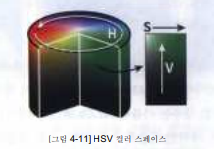

H 값은 그 픽셀이 어떤 색인지를 표현합니다. 원 위에 빨강에서 시작해서 노랑，초
록，파랑을 거쳐 다시 빨강으로 돌아오는 방식으로 색상에 매칭되는 숫자를 매겨놓
고 그 360° 범위의 값을 갖게 해서 색을 표현합니다. 하지만，OpenCV에서 영상을
표현할 때 사용하는 배 열의 dtype은 최대 값이 255를 넘지 못하므로 360을 반으로
나누어 0~180 범위의 값으로 표현하고 180보다 큰 값인 경우에는 180으로 간주합
니다.


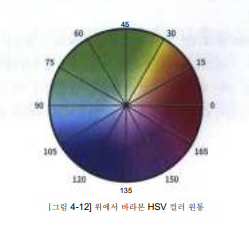

앞의 그림은 H 값만을 원통의 위에서 바라보는 시각으로 다시 그린 것에 각 색상별
로 수치를 표시한 것입니다. 이 그림을 요약해서 대략 R，G，B 색상의 범위에 맞는 H
값을 표시하면 아래와 같습니다.


**• 빨강: 165 ~ 180,0 ~ 15**

**• 초록:45 ~ 75**

**• 파랑: 90 ~ 120**


S 값은 채도，포화도，또는 순도로 해석할 수 있는데，해당 색상이 얼마나 순수하게
포함되어 있는지를 표현합니다. S 값은 0~255 범위로 표현하며，255는 가장 순수한
색상을 표현합니다.

V 값은 명도로서 빛이 얼마나 밝은지 어두운지를 표현하는 값입니다. 이 값도 범
위가 0 ~ 255이며，255인 경우가 가장 밝은 상태이고 0(영，zero)인 경우가 가장 어두
운 상태로 검은색이 표시됩니다.
BGR 포맷과 HSV 포맷 간의 변환은 cv2.cvtColor() 함수에 cv2.C0L0R_BGR2HSV와
Cv2.C0L0R_HSV2BGR 플래그 상수를 이용합니다.
아래의 예제는 완전한 빨강，초록，파랑 그리고 노랑을 BGR 포맷으로 표현해서
HSV로 변환하여 어떤 값인지를 알아보는 예제입니다.

예제4-7

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

#---① BGR 컬러 스페이스로 원색 픽셀 생성
red_bgr = np.array([[[0,0,255]]], dtype=np.uint8)   # 빨강 값만 갖는 픽셀
green_bgr = np.array([[[0,255,0]]], dtype=np.uint8) # 초록 값만 갖는 픽셀
blue_bgr = np.array([[[255,0,0]]], dtype=np.uint8)  # 파랑 값만 갖는 픽셀
yellow_bgr = np.array([[[0,255,255]]], dtype=np.uint8) # 노랑 값만 갖는 픽셀

#---② BGR 컬러 스페이스를 HSV 컬러 스페이스로 변환
red_hsv = cv2.cvtColor(red_bgr, cv2.COLOR_BGR2HSV);
green_hsv = cv2.cvtColor(green_bgr, cv2.COLOR_BGR2HSV);
blue_hsv = cv2.cvtColor(blue_bgr, cv2.COLOR_BGR2HSV);
yellow_hsv = cv2.cvtColor(yellow_bgr, cv2.COLOR_BGR2HSV);

#---③ HSV로 변환한 픽셀 출력
print("red:",red_hsv)
print("green:", green_hsv)
print("blue", blue_hsv)
print("yellow", yellow_hsv)


red: [[[  0 255 255]]]
green: [[[ 60 255 255]]]
blue [[[120 255 255]]]
yellow [[[ 30 255 255]]]


앞의 [예제 4-기의 코드 ①에서 빨강，초록，파랑，노랑에 해당하는 채널에만 최대 값
인 255를 지정하고 나머지 채널에는 O(zero)을 지정해서 순도 높은 원색을 표현하고
코드 ②에서 HSV 컬러 스페이스로 변환한 후에 각 픽셀 값을 출력하고 있습니다. 출
력 결과는 다음과 같습니다. 출력 결과를 살펴보면 가장 순도 높은 빨강의 H 값은 0, 초록은 60, 파랑은 120, 노랑
은 30인 것을 확인할 수 있습니다.
픽셀의 색상이 궁금할 때 **RGB 포맷의 경우 세 가지 채널의 값**을 모두 조사해야 하
지만，**HSV 포맷은 오직 H 채널 값만 확인**하면 되므로 색상을 기반으로 하는 여러 가
지 작업에 효과적입니다.


###4.2.5 YUV, YcbCr
YUV 포맷은 사람이 색상을 인식할 때 밝기에 더 민감하고 색상은 상대적으로 둔
감한 점을 고려해서 만든 컬러 스페이스입니다. Y는 밝기(Luma)를 표현하고，U
(Chroma Blue, Cb)는 밝기와 파란색과의 색상 차，V(Chroma Red, Cr)는 밝기와
빨간색과의 색상 차를 표현합니다. Y(밝기)에는 많은 비트수를 할당하고 U(Cb)와
V(Cr)에는 적은 비트 수를 할당해서 데이터를 압축하는 효과를 갖습니다.

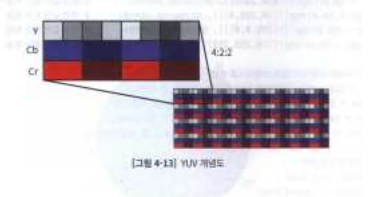

YUV라는 용어는 TV 방송에서 사용하는 아날로그 컬러 인코딩 시스템 인 PAL(Phase
Alternating Line)에서 정의한 용어입니다. **YUV는 종종 YCbCr 포맷**과 혼용되기도
하는데，본래 YUV는 텔레비전 시스템에서 아날로그 컬러 정보를 인코딩하는 데 사
용하고，YCbCr 포맷은 MPEG나 JPEG와 같은 디지털 컬러 정보를 인코딩하는 데 사
용하였습니다. YUV는 요즘 들어 YCbCr로 인코딩된 파일 포맷을 설명하는 용어로
일반적으로 사용됩니다. 실제로도 YUV와 YCbCr은 RGB 포맷에서 변환하기 위한
공식이 달라서 OpenCV는 cv2.C0L0R_BGR2YUV, cv2.C0L0R_BGR2YCrCb가 따로 있고 변
환 결과도 미세하게 다릅니다. 이 책에서는 편의상 같은 시스템으로 보고 YUV 컬러
스페이스만 다룹니다. YUV는 밝기 정보와 컬러 정보를 분리해서 사용하므로 명암
대비(contrast)가 좋지 않은 영상을 좋게 만드는 데 대표적으로 활용됩니다.
[예제 4-8]은 완전히 어두운 값과 완전히 밝은 값 그리고 중간 값을 BGR로 표현한
후에 YUV로 변환한 3개 채널을 살펴봅니다.

예제4-8

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


#---① BGR 컬러 스페이스로 3가지 밝기의 픽셀 생성
dark = np.array([[[0,0,0]]], dtype=np.uint8)        # 3 채널 모두 0인 가장 어두운 픽셀
middle = np.array([[[127,127,127]]], dtype=np.uint8) # 3 채널 모두 127인 중간 밝기 픽셀
bright = np.array([[[255,255,255]]], dtype=np.uint8) # 3 채널 모두 255인 가장 밝은 픽셀

#---② BGR 컬러 스페이스를 YUV 컬러 스페이스로 변환
dark_yuv = cv2.cvtColor(dark, cv2.COLOR_BGR2YUV)
middle_yuv = cv2.cvtColor(middle, cv2.COLOR_BGR2YUV)
bright_yuv = cv2.cvtColor(bright, cv2.COLOR_BGR2YUV)

#---③ YUV로 변환한 픽셀 출력
print("dark:",dark_yuv)
print("middle:", middle_yuv)
print("bright", bright_yuv)


dark: [[[  0 128 128]]]
middle: [[[127 128 128]]]
bright [[[255 128 128]]]


위 [예제 4-8]의 코드 ①에서 세 가지 밝기의 픽셀을 BGR 컬러 스페이스로 생성하고
나서 코드 ②에서 YUV 컬러 스페이스로 변환하고 출력합니다. 출력 결과는 다음과
같습니다.
앞의 출력 결과에서 밝기 정도는 첫 번째 Y 채널에만 나타나는 것을 알 수 있습니다.
픽셀의 밝기를 제어해야 할 때 BGR 포맷은 3채널을 모두 연산해야 하지만，YUV 포
맷은 노채널 하나만 작업하면 되므로 효과적 입니다.



##4.3 스레시홀딩
앞서 4.2절에서 살펴본 것과 같이 이미지를 검은색과 횐색만으로 표현한 것을 바이너리(binary, 이진화) 이미지라고 합니다. 이렇게 하는 이유는 이미지에서 원하는 피사체의 모양을 좀 더 정확히 판단하기 위해서입니다. 예를 들면，종이에서 글씨만을
분리하거나배경에서 전경을분리하는 것과같은 작업입니다.
스레시홀딩(thresholding)이란 여러 점수를 커트라인을 기준으로 합격과 불합격
으로 나누는 것처럼 여러 값을 경계점을 기준으로 두 가지 부류로 나누는 것으로，바이너리 이미지를 만드는 가장 대표적인 방법 입니다.


###4.3.1 전역 스레시 홀딩
바이너리 이미지를 만들기 위해서는 컬러 이미지를 그레이 스케일로 바꾸고 각 픽
셀의 값이 경계 값을 넘으면 255, 넘지 못하면 0을 지정합니다. 이런 작업은 간단한
NumPy 연산만으로도 충분히 할 수 있지만，OpenCV는 cv2.threshold() 함수로 더
많은 기능을 제공합니다.
[예제 4-9]는 NumPy 연산과 OpenCV 함수로 각각 바이너 리 이미지를 만드는 과
정을 보여줍니다.


127.0


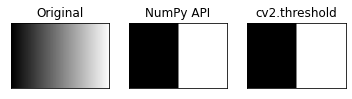

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt


img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/gray_gradient.jpg', cv2.IMREAD_GRAYSCALE) #이미지를 그레이 스케일로 읽기

# --- ① NumPy API로 바이너리 이미지 만들기
thresh_np = np.zeros_like(img)   # 원본과 동일한 크기의 0으로 채워진 이미지
thresh_np[ img > 127] = 255      # 127 보다 큰 값만 255로 변경

# ---② OpenCV API로 바이너리 이미지 만들기
ret, thresh_cv = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY) 
print(ret)  # 127.0, 바이너리 이미지에 사용된 문턱 값 반환

# ---③ 원본과 결과물을 matplotlib으로 출력
imgs = {'Original': img, 'NumPy API':thresh_np, 'cv2.threshold': thresh_cv}
for i , (key, value) in enumerate(imgs.items()):
    plt.subplot(1, 3, i+1)
    plt.title(key)
    plt.imshow(value, cmap='gray')
    plt.xticks([]); plt.yticks([])

plt.show()



［예제 4-9］는 검은색에서 흰색으로 점점 변하는 그러데이션 이미지를 그레이 스케일 
로 읽어서 바이너리 이미지를 만드는 예제입니다. 코드 ①에서 원본 이미지와 같은 크기이면서 O(zero)으로 채워진 NumPy 배열을 생성하고 나서 127보다 큰 값을 갖 는 요소에 255를 할당하는 연산을 해서 바이너리 이미지로 만들고 있습니다. 코드 ②는 cv2.threshold() 함수를 이용해서 간단히 바이너리 이미지를 만들고 있 
습니다. 코드 ③은 각각 생성한 바이너리 이미지와 원본 이미지를 출력합니다. 이때 
사용한 cv2.threshold() 함수의 사용법은 다음과 같습니다.

• ret, out = cv2.threshold(img, threshold, value, type_flag) 

• img： NumPy 배열，변환할 이미지 

• threshold： 경계 값  

• value： 경계 값 기준에 만족하는 픽셀에 적용할 값 

• type.flag： 스레시흘드 적용 방법 지정 

• cv2.THRESH_BINARY: px > threshold ? value : 0，픽셀 값이 경계 값을 넘으 면 value를 지정하고，넘지 못하면 0을 지정 

• cv2.THRESH_BINARY_INV： px > threshold ? 0 : value, cv2.THRESH_BINARY의 
반대 

• cv2.THRESH_TRUNC: px > threshold ? value : px, 픽셀 값이 경계 값을 넘으 면 value를 지정하고，넘지 못하면 원래의 값 유지

• cv2.THRESH_T0ZER0： px > threshold  ? px : 0，픽셀 값이 경계 값을 넘으면 원래 값을 유지，넘지 못하면 0을 지정 

• cv2.THRESH_T0ZER0_INV： px > threshold ? 0 : px, cv2.THRESH一TO社R0의 
반대 

• ret： 스레시홀딩에 사용한 경계 값 

• out： 결과 바이너 리 이미지


이 함수의 반환 값은 튜플로 2개의 값을 반환하는데，첫 번째 항목은 스레시홀딩에 사용한 경계 값이고，두 번째 항목은 스레시홀딩된바이너리 이미지입니다. 대부분 의 경우 첫 번째 반환 항목인 ret는 threshold 인자로 전달한 값과 같아서 쓸모 없습니다. 이 함수는 단순히 경계 값에 따라 0과 255로 나누는 cv2.THRESH_BINARY 말고도 몇 가지 기능의 플래그 상수를 사용할 수 있게 해줍니다. 아래 [예제 4-1 이에서는 위에 
나열한 몇 가지 다른 플래그를 이용한 스레시홀딩을 사례로 보여줍니다. 코드와 실 
행 결과만 봐도 쉽게 이해할 수 있을 것입니다.

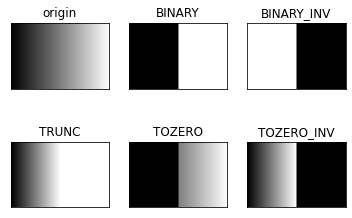

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/gray_gradient.jpg', cv2.IMREAD_GRAYSCALE)

_, t_bin = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
_, t_bininv = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY_INV)
_, t_truc = cv2.threshold(img, 127, 255, cv2.THRESH_TRUNC)
_, t_2zr = cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO)
_, t_2zrinv = cv2.threshold(img, 127, 255, cv2.THRESH_TOZERO_INV)

imgs = {'origin':img, 'BINARY':t_bin, 'BINARY_INV':t_bininv, \
        'TRUNC':t_truc, 'TOZERO':t_2zr, 'TOZERO_INV':t_2zrinv}
for i, (key, value) in enumerate(imgs.items()):
    plt.subplot(2,3, i+1)
    plt.title(key)
    plt.imshow(value, cmap='gray')
    plt.xticks([]);    plt.yticks([])
    
plt.show()

###4.3.2 오츠의 알고리즘
바이너리 이미지를 만들 때 가장 중요한 작업은 경계 값을 얼마로 정하느냐입니다. 
종이에 출력한 문서를 바이너리 이미지로 만드는 것을 예를 들면，새하얀 종이에 검은색으로 출력된 문서의 영상이라면 굳이 스레시홀드를 적용할 필요가 없습니다. 하지만，현실은 흰색，누런색，회색 종이에 검은색，파란색 등으로 인쇄된 문서가 더 많기 때문에 적절한 경계 값을 정하기 위해서는 여러 차례에 걸쳐 경계 값을 조금씩 수정해 가면서 가장 좋은 경계 값을 찾아야 합니다.


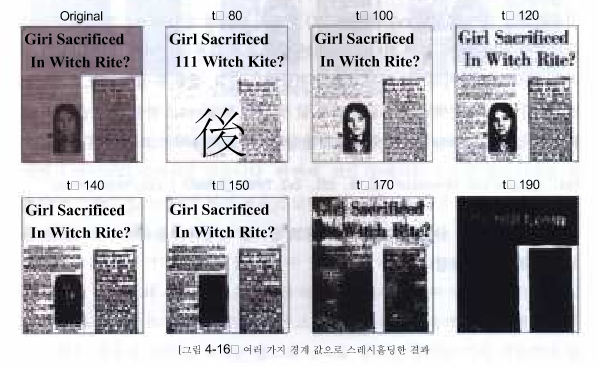

［그림 4-16］은 오래된 신문 기사(내용은 좀 끔찍하군요)를 스크랩해서 스캔한 영상인 
데，왼쪽 처음 그림이 원본이고 경계 값을 80부터 20씩 증가시키면서 스레시홀딩한 결과입니다. 결과를 살펴보면 아마도 글씨와 그림을 가장 잘 얻을 수 있는 경계 값은 
120과 140 사이쯤인 것을 알 수 있습니다. 그러니까 다음번에 시도해 볼 경계 값은 
130 정도가 적당해 보입니다. 이와 같이 반복적인 경계 값 찾기 시도는 귀찮고 시간 
도 많이 걸립니다.
1979년 오츠 노부유키(Nobuyuki Otsu)는 반복적인 시도 없이 한 번에 효율적으 
로 경계 값을 찾을 수 있는 방법을 제안했는데，그의 이름을 따서 그것을 오츠의 이 
진화 알고리즘(Otsu’s binarization method)이라고 합니다. 오츠의 알고리즘은 경 계 
값을 임의로 정해서 픽셀들을 두 부류로 나누고 두 부류의 명암 분포를 반복해서 구 
한 다음 두 부류의 명암 분포를 가장 균일하게 하는 경계 값을 선택합니다. 이것을 
수식으로 표현하면 다음과 같습니다.




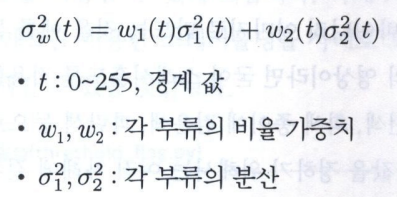

OpenCV는 이미 구현한 오츠의 알고리즘을 사용할 수 있게 제공해 주는데，이것을 
사용하려면 앞서 설명한 cv2.threshold() 함수의 마지막 인자에 cv2.THRESH_0TSU를 
추가해서 전달하기만 하면 됩니다. 그러면 원래 경계 값을 전달해야 하는 두 번째 인자 threshold는 무시되므로 아무 숫자나 전달해도 되고，실행 후 결과 값으로 오츠의 알고리즘에 의해 선택된 경계 값은 반환 값 첫 번째 항목 ret로 받을 수 있습니다. 아래 코드는 cv2.threshold() 함수에 오츠의 알고리즘을 적용하는 코드입니다.

ret, = cv2.threshold(img, 0, 255, cv2.THRESH.BINARY | cv2.THRESH_0TSU)


마지막 플래그에는 앞서 설명한 스레시홀드 방식을 결정하는 플래그와 파이프(|) 문자로 연결하여 전달합니다

otsu threshold: 131.0


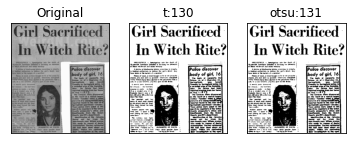

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

# 이미지를 그레이 스케일로 읽기
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/scaned_paper.jpg', cv2.IMREAD_GRAYSCALE) 
# 경계 값을 130으로 지정  ---①
_, t_130 = cv2.threshold(img, 130, 255, cv2.THRESH_BINARY)        
# 경계 값을 지정하지 않고 OTSU 알고리즘 선택 ---②
t, t_otsu = cv2.threshold(img, -1, 255,  cv2.THRESH_BINARY | cv2.THRESH_OTSU) 
print('otsu threshold:', t)                 # Otsu 알고리즘으로 선택된 경계 값 출력

imgs = {'Original': img, 't:130':t_130, 'otsu:%d'%t: t_otsu}
for i , (key, value) in enumerate(imgs.items()):
    plt.subplot(1, 3, i+1)
    plt.title(key)
    plt.imshow(value, cmap='gray')
    plt.xticks([]); plt.yticks([])

plt.show()

［예제 4-11］의 코드 ①에서는 기존에 여러 번 시도해서 알아낸 경계 값 130을 직접 지 
정해서 바이너리 이미지를 얻습니다. 반면에，코드 ②에서는 오츠의 알고리즘을 적 
용하고 경계 값으로는 의미 없는 -1 을 전달했더니 결과적으로 경계 값 131을 자동으 
로 계산해서 반환하고 적절한 바이너리 이미지를 얻게 됐습니다. 사람이 여러 번 시 
도해서 얻는 값과 거의 비슷한 것을 알 수 있습니다. 하지만，오츠의 알고리즘은 모 
든 경우의 수에 대해 경계 값을 조사해야 하므로 속도가 빠르지 못하다는 단점이 있 
습니다. 또한 노이즈가 많은 영상에는 오츠의 알고리즘을 적용해도 좋은 결과를 얻 
지 못하는 경우가 많은데，이때는 앞으로 살펴볼 블러링 필터를 먼저 적용해야 합 
니다.


###4.3.3 적응형 스레시홀드
원본 영상에 조명이 일정하지 않거나 배경색이 여러 가지인 경우에는 아무리 여러 
번 경계 값을 바꿔가며 시도해도 하나의 경계 값을 이미지 전체에 적용해서는 좋은 
결과를 얻지 못합니다. 이때는 이미지를 여러 영역으로 나눈 다음 그 주변 픽셀 값만 
가지고 계산을 해서 경계 값을 구해야 하는데，이것을 적응형 스레시홀드(adaptive threshold)라고 합니다.
OpenCV에서는 이 기능을 다음 함수로 제공합니다.


• cv2.adaptiveThreshoId(img, value, method, type_flag, block_size, C)


• img： 입력 영상


• value： 경계 값을 만족하는 픽셀에 적용할 값


• method： 경계 값 결정 방법


• cv2.ADPTIVE_THRESH_MEAN_C: 이웃 픽셀의 평균으로 결정


• cv2.ADPTIVE_THRESH_GAUSSIAN_C: 가우시안 분포에 따른 가중치의 합으로 
결정


• type_flag： 스레시홀드 적용 방법 지정(cv2.threshold() 함수와 동일)


• blocksize： 영역으로 나눌 이웃의 크기(n x n), 홀수(3, 5,7,...)


• C： 계산된 경계 값 결과에서 가감할 상수(음수 가능)


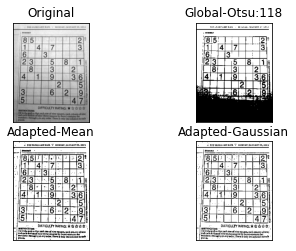

In [ ]:
import cv2
import numpy as np 
import matplotlib.pyplot as plt 

blk_size = 9        # 블럭 사이즈
C = 5               # 차감 상수 
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/sudoku.jpg', cv2.IMREAD_GRAYSCALE) # 그레이 스케일로  읽기

# ---① 오츠의 알고리즘으로 단일 경계 값을 전체 이미지에 적용
ret, th1 = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

# ---② 어뎁티드 쓰레시홀드를 평균과 가우시안 분포로 각각 적용
th2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,\
                                      cv2.THRESH_BINARY, blk_size, C)
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, \
                                     cv2.THRESH_BINARY, blk_size, C)

# ---③ 결과를 Matplot으로 출력
imgs = {'Original': img, 'Global-Otsu:%d'%ret:th1, \
        'Adapted-Mean':th2, 'Adapted-Gaussian': th3}
for i, (k, v) in enumerate(imgs.items()):
    plt.subplot(2,2,i+1)
    plt.title(k)
    plt.imshow(v,'gray')
    plt.xticks([]),plt.yticks([])

plt.show()

위 ［예제 4-12］의 코드 ①은 앞서 설명한 오츠의 알고리즘을 적용해서 얻은 96을 경 
계 값으로 전체 이미지에 적용했지만 결과를 보면 좌측 하단은 검게 타버리고，우측 
상단은 하얗게 날아간 것을 알 수 있습니다. 반면에，코드 ②에서는 적응형 스레시홀 
드를 평균 값과 가우시안 분포를 각각 적용해서 훨씬 좋은 결과를 얻을 수 있습니다. 
그중에서도 가우시안 분포를 이용한 결과는 선명함은 떨어지지만 **잡티(noise)가 훨씬 적은 것**을 알 수 있습니다. 이 부분에 대해서는 6장 “영상 필터”에서 자세히 다룹 
니다.경계 값을 전체 이미지에 적용하는 것을 **전역적(global) 적용**이라고 하는 반면에， 
이미지를 여러 구역으로 나누어 그 구역에 맞는 경계 값을 찾는 것을 **지역적(local)적용** 이라고 합니다. 대부분의 이미지는 조명 차이와 그림자 때문에 지역적 적용이 
필요합니다.



##4.4 이미지 연산
이제부터 본격적으로 영상에 연산하는 방법을 알아봅니다. 연산 결과는 새로운 영상 
을 만들어 내므로 그 자체가 목적이 될 수도 있지만，정보를 얻기 위한 과정일 수도 
있습니다.


###4.4.1 영상과 영상의 연산

영상에 연산을 할 수 있는 방법은 NumPy의 브로드캐스팅 연산을 직접 적용하는 방 
법과 OpenCV에서 제공하는 네 가지 함수를 사용하는 방법 이 있습니다. OpenCV에 
서 굳이 연산에 사용할 함수를 제공하는 이유는 영상에서의 한 픽셀이 가질 수 있는 
값의 범위는 0〜255인데，더하기나 빼기 연산을 한 결과가 255보다 클 수도 있고 0보 
다 작을 수도 있어서 결과 값을 0과 255로 제한할 안전 장치가 필요하기 때문입니다. 
OpenCV에는 아래의 함수로 이와 같은 기능을 제공합니다.


• dest=cv2.add(srcl, src2[, dest, mask, dtype]): srcl과 src2 더하기

• srcl： 입력 영상 1 또는 수

• src2： 입력 영상 2 또는 수

• dest： 출력 영상

• mask： 0이 아닌 픽 셀만 연산

• dtype： 출력 dtype

• dest=cv2.substract(srcl, src2[, dest, mask, dtype]): srcl에人어 src2를 빼기

• 모든 인자는 cv2.add() 함수와 동일

• dest=cv2.multiply(srcl, src2[, dest, scale, dtype]》: srcl과 src2를 곱하기

• scale： 연산 결과에 추가 연산할 값

• dest=cv2.divide(srcl, src2[, dest, scale, dtype]》: srcl을 src2로 나누기


• 모든 인자는 cv2.multiply()와 동일




In [ ]:
import cv2
import numpy as np

# ---① 연산에 사용할 배열 생성
a = np.uint8([[200, 50]]) 
b = np.uint8([[100, 100]])

#---② NumPy 배열 직접 연산
add1 = a + b
sub1 = a - b
mult1 = a * 2
div1 = a / 3

# ---③ OpenCV API를 이용한 연산
add2 = cv2.add(a, b)
sub2 = cv2.subtract(a, b)
mult2 = cv2.multiply(a , 2)
div2 = cv2.divide(a, 3)

#---④ 각 연산 결과 출력
print(add1, add2)
print(sub1, sub2)
print(mult1, mult2)
print(div1, div2)

[[ 44 150]] [[255 150]]
[[100 206]] [[100   0]]
[[144 100]] [[255 100]]
[[66.66666667 16.66666667]] [[67 17]]


[예제 4-13]의 코드 ①에서 연산을 테스트할 대상으로 NumPy 배열을 생성합니다.
 
코드 ②는 사칙 연산자를 직접 사용했고，코드 ③은 OpenCV의 4개의 함수를 이용 
했습니다. 코드 ④에서 결과를 각각 출력하고 있습니다.

출력 결과를 살펴보면 200과 100을 더하고 50과 100을 더한 결과가 각각 44와 
255, 150과 150으로 50과 100의 결과는 동일하게 나타납니다. 하지만，200과 100 
을 더한 결과는 300인데，더하기(+) 연산자로 직접 더한 결과는 255를 초과하는 44 
이고, cv2.add() 함수의 결과는 최대 값인 255입니다. 50에서 100을 빼는 연산은 -50인데，마찬가지로 직접 빼기(-) 연산한 결과는 206으로 정상적이지 않지만，cv2. 
subtractO 함수의 결과는 최소 값인 0입니다. 곱하기와 나누기 연산도 OpenCV 함 
수의 결과는 255를 초과하지 않고 소수점 이하를 갖지 않습니다. OpenCV의 네 가지 연산 함수 중에 cv2.add() 함수를 대표로 해서 좀 더 자세히 설 
명해 보겠습니다. 함수의 첫 번째와 두 번째 인자에는 연산의 대상을 NumPy 배 열로 
전달합니다. 그 두 인자를 더한 결과는 세 번째 인자로 전달한 배 열에 할당하고 결과 
값으로 다시 반환합니다. 만약 c = a + b와 같은 연산이 필요하다면 다음의 세 코드 
의 결과는 똑같습니다.


c = cv2.add(a, b) 또는 c = cv2.add(a, b, None) 또는 cv2.add(a, b, c)

만약 b += a와 같이 두 입력의 합산 결과를 입력 인자의 하나에 재할당하고 싶을 때는 다음의 두 코드와 같이 작성할 수 있고 결과는 같습니다.

cv2.add(a, b, b) 또는 b = cv2.add(a, b)

하지만，네 번째 인자인 mask를 지정하는 경우에는 얘기가 다릅니다. 네 번째 인자 
에 전달한 NumPy 배열에 어떤 요소 값이 0이면 그 위치의 픽셀은 연산을 하지 않습 
니다. 이때 세 번째 인자인 결과를 할당할 인자의 지정 여부에 따라 결과는 달라집니 
다. 코드로 예를 들어 보겠습니다.


In [ ]:
import cv2
import numpy as np

#---① 연산에 사용할 배열 생성
a = np.array([[1, 2]], dtype=np.uint8)
b = np.array([[10, 20]], dtype=np.uint8)
#---② 2번째 요소가 0인 마스크 배열 생성 
mask = np.array([[1, 0]], dtype=np.uint8)

#---③ 누적 할당과의 비교 연산
c1 = cv2.add( a, b , None, mask)
print(c1)
c2 = cv2.add( a, b , b.copy(), mask)
print(c2, b)


[[11  0]]
[[11 20]] [[10 20]]


[예제 4-14]에서 a와 b의 더하기 연산은 1+10, 2+20 연산이 각각 이뤄져야 하지만，네 
번째 인자인 mask의 두 번째 요소의 값이 0이므로 2+20의 연산은 이루어지지 않습니 
다. 따라서 cl의 결과는 11과 0입니다. 하지만，누적 할당을 적용한 C2의 두 번째 항 
목은 b의 두 번째 항목인 20을 그대로 갖게 됩니다. 이때 주의할 것은 b도 c2와 동일 
하게 연산의 결과를 갖게 되는 것입니다. 만약 b의 값이 연산 전 상태를 그대로 유지 
되길 원한다면 아래와 같이 수정해서 사용할 수 있습니다.
c2 = cv2.add( a, b , b.copyO, mask)


###4.4.2 알파 블랜딩
두 영상을 합성하려고 할 때 앞서 살펴본 더하기(+) 연산이나 cv2.add() 함수만으로 
는 좋은 결과를 얻을 수 없는 경우가 많습니다. 직접 더하기 연산을 하면 255를 넘는 
경우 초과 값만을 가지므로 영상이 거뭇거뭇하게 나타나고 cv2.add() 연산을 하면 
대부분의 픽셀 값이 255 가까이 몰리는 현상이 일어나서 영상이 하얗게 날아간 것처 
럼 보입니다. 아래의 [예제 4-15]와 그 결과인 [그림 4-19]는 이런 현상을 보여주고 있 
습니다.


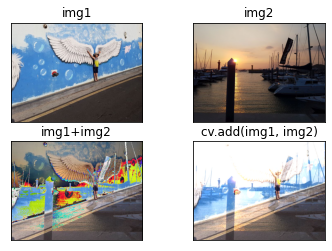

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

# ---① 연산에 사용할 이미지 읽기
img1 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/wing_wall.jpg')
img2 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/yate.jpg')

# ---② 이미지 덧셈
img3 = img1 + img2  # 더하기 연산
img4 = cv2.add(img1, img2) # OpenCV 함수

imgs = {'img1':img1, 'img2':img2, 'img1+img2': img3, 'cv.add(img1, img2)': img4}

# ---③ 이미지 출력
for i, (k, v) in enumerate(imgs.items()):
    plt.subplot(2,2, i + 1)
    plt.imshow(v[:,:,::-1])
    plt.title(k)
    plt.xticks([]); plt.yticks([])

plt.show()


실행 결과의 imgl+img2는 화소가 고르지 못하고 중간 중간 이상한 색을 띠고 있는 부분이 있는데，그 부분이 255를 초과한 영역입니다. cv2. add (imgl, img2)의 실행 결과 
는 전체적으로 하얀 픽셀을 많이 가져가므로 좋은 결과로 볼 수 없습니다.
두 영상을 합성하려면 각 픽셀의 합이 255가 되지 않게 각각의 영상에 **가중치**를 
줘서 계산해야 합니다. 예를 들어 두 영상이 정확히 절반씩 반영된 결과 영상을 원한다면 각 영상의 픽셀 값에 각각 50%씩 곱해서 새로운 영상을 생성하면 됩니다. 이것을 수식으로 나타내면 다음과 같고 이때 각 영상에 적용할 가중치를 알파(alpha) 값이라고 부릅니다. 알파 값을 조정해서 7：3, 6 : 4, 5 : 5 등과 같이 배분하는 방식입니다.


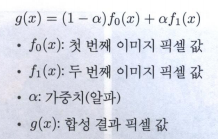


이 수식대로 NumPy 배열에 직접 연산해도 되지만，OpenCV는 이것을 구현한 함수 
를 제공합니다.


• cv2.addWeight(img1, alpha, img2, beta, gamma)

• img1, img2： 합성할 두 영상

• alpha: img1에 지정할 가중치(알파 값)

• beta： img2에 지정할 가중치, 혼히 (1- alpha) 적용

• gamma： 연산 결과에 가감할 상수，흔히 O(zero) 적용

아래 ［예제 4-16］은 각 영상에 대해서 50%씩의 가중치로 앞서 실습한 영상을 다시 합 
성하고 있습니다.


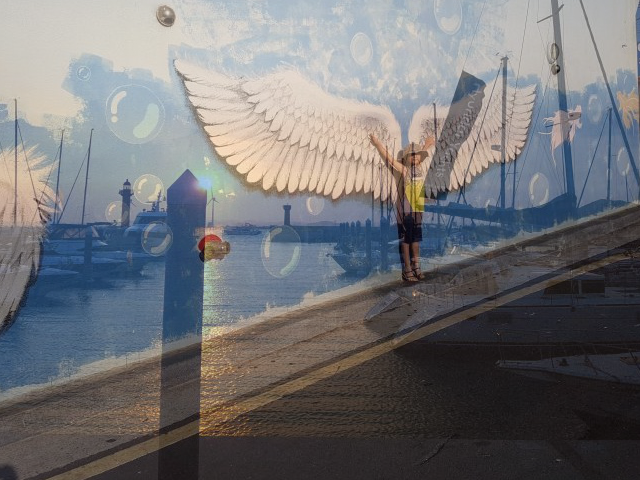

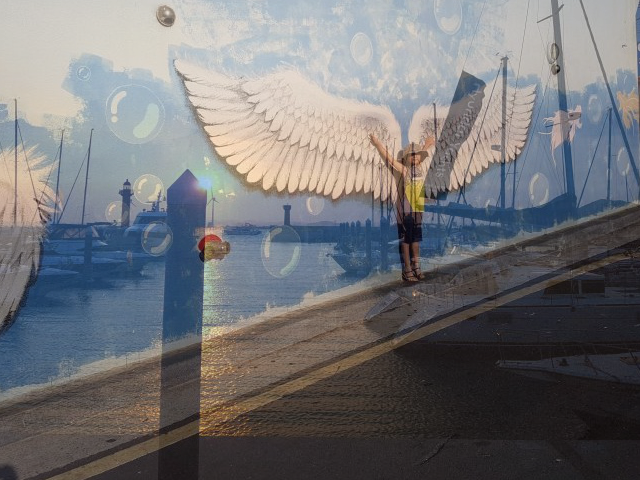

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow


alpha = 0.5 # 합성에 사용할 알파 값

#---① 합성에 사용할 영상 읽기
img1 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/wing_wall.jpg')
img2 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/yate.jpg')

# ---② NumPy 배열에 수식을 직접 연산해서 알파 블렌딩 적용
blended = img1 * alpha + img2 * (1-alpha)
blended = blended.astype(np.uint8) # 소수점 발생을 제거하기 위함
cv2_imshow( blended)

# ---③ addWeighted() 함수로 알파 블렌딩 적용
dst = cv2.addWeighted(img1, alpha, img2, (1-alpha), 0) 
cv2_imshow( dst)

cv2.waitKey(0)
cv2.destroyAllWindows()

［예제 4-16］의 코드 ②는 앞서 수식으로 나타낸 알파 블렌딩을 NumPy 배 열에 직접 적용하였고，코드 ③은 cv2.addWeighted() 함수로 적용해서 같은 결과를 가져오는 
것을 보여주고 있습니다.
아래의 ［예제 4-17]은 남자의 얼굴과 사자의 얼굴을 알파 블렌딩하는 데 트랙바로 
알파 값을 조정할 수 있게 했습니다. 트랙바를 움직여서 알파 값을 조정하면 마치 사 
람이 서서히 사자로 바뀌는 것처럼 보입니다. 알파 블렌딩은 혼히 페이드-인/아웃 
(fade-in/out) 기법으로 영상이 전환되는 장면에서 자주 사용되며，《구미호》나《늑대인간》같은 영화의 변신 장면에서 얼굴 모핑(face morphing)이라는 기법으로 효 
과를 내는데，이 기법을 구성하는 한 가지 기술이기도 합니다.


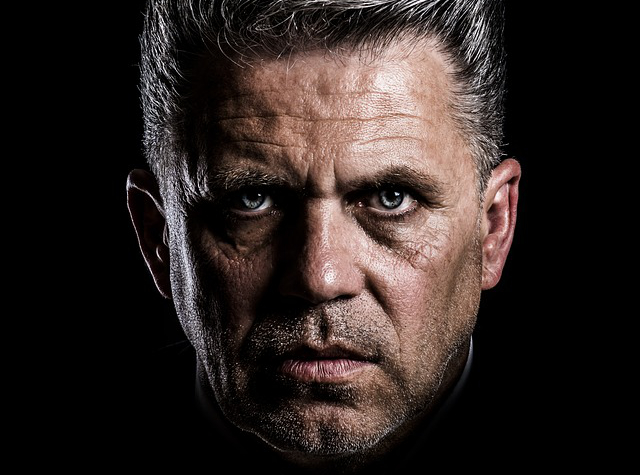

error: ignored

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

win_name = 'Alpha blending'     # 창 이름
trackbar_name = 'fade'          # 트렉바 이름

# ---① 트렉바 이벤트 핸들러 함수
def onChange(x):
    alpha = x/100
    dst = cv2.addWeighted(img1, 1-alpha, img2, alpha, 0) 
    cv2_imshow(dst)


# ---② 합성 영상 읽기
img1 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/man_face.jpg')
img2 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/lion_face.jpg')

# ---③ 이미지 표시 및 트렉바 붙이기
cv2_imshow(img1)
cv2.createTrackbar(trackbar_name, win_name, 0, 100, onChange)

cv2.waitKey()
cv2.destroyAllWindows()

###4.4.3 비트와이즈 연산
OpenCV는 두 영상의 각 픽셀에 대한 비트와이즈(bitwise, 비트 단위) 연산 기능을 
제공합니다. 비트와이즈 연산은 두 영상을 합성할 때 특정 영역만 선택하거나 특정 
영역만 제외하는 등의 선별적인 연산에 도움이 됩니다. OpenCV에서 제공하는 비트 
와이즈 연산 함수는 다음과 같습니다.


• bitwise_and(imgl, img2, mask=None): 각 픽셀에 대해 비트와이즈 AND 연산

• bitwise_or(imgl, img2, mask=None): 각 픽셀에 대해 비트와이즈 OR 연산

• bitwise_xor(imgl, img2, mask=None): 각 픽셀에 대해 비트와이즈 XOR 연산

• bitwise_not(imgl, mask=None): 각 픽셀에 대해 비트와이즈 NOT 연산

• imgl, img2： 연산 대상 영상，동일한 shape

• mask： 0이 아닌 픽셀만 연산，바이너 리 이미지


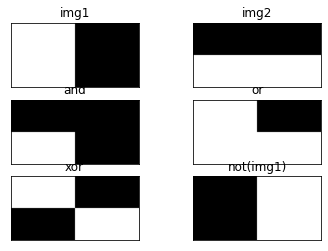

In [ ]:
import numpy as np, cv2
import matplotlib.pylab as plt

#--① 연산에 사용할 이미지 생성
img1 = np.zeros( ( 200,400), dtype=np.uint8)
img2 = np.zeros( ( 200,400), dtype=np.uint8)
img1[:, :200] = 255         # 왼쪽은 검정색(0), 오른쪽은 흰색(255)
img2[100:200, :] = 255      # 위쪽은 검정색(0), 아래쪽은 흰색(255)

#--② 비트와이즈 연산
bitAnd = cv2.bitwise_and(img1, img2)
bitOr = cv2.bitwise_or(img1, img2)
bitXor = cv2.bitwise_xor(img1, img2)
bitNot = cv2.bitwise_not(img1)

#--③ Plot으로 결과 출력
imgs = {'img1':img1, 'img2':img2, 'and':bitAnd, 
          'or':bitOr, 'xor':bitXor, 'not(img1)':bitNot}
for i, (title, img) in enumerate(imgs.items()):
    plt.subplot(3,2,i+1)
    plt.title(title)
    plt.imshow(img, 'gray')
    plt.xticks([]); plt.yticks([])

plt.show()

위 ［예제 4-18］의 실행 결과를 보면 이해하기 쉬울 것입니다. img1은 좌우로，img2는 
위아래로 0과 255로 나누어 200 x 400 크기의 영상을 생성했습니다. 이 두 영상에 
대해서 각각 비트와이즈 연산을 한 결과입니다. cv2.bitwise_and() 연산은 두 영상 
에서 0으로 채워진 부분이 만나는 부분은 모두 0으로 채워졌습니다. cv2.bitwise. 
or() 연산은 두 영상에서 255로 채워진 부분은 모두 255로 채워졌습니다. cv2.bitwise_xor() 연산은 두 영상에서 서로 다른 값을 가진 부분은 255로，서로 같은 값 
을 가진 부분은 0으로 채워졌습니다. imgl에 대한 cv2.bitwise_not() 연산은 원래의 
반대의 결과를 갖습니다.
［예제 4-19］는 비트와이즈 연산으로 영상의 일부분을 원하는 모양으로 떼내는 예제 
입니다.



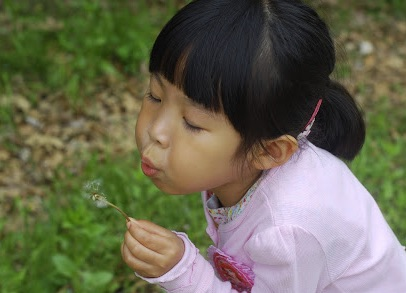

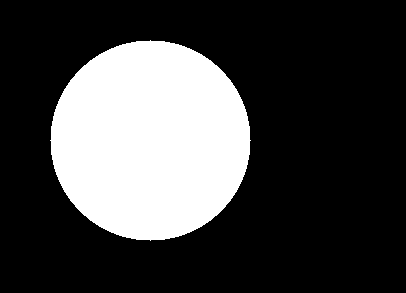

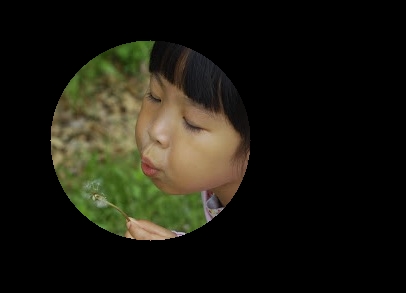

In [ ]:
import numpy as np, cv2
import matplotlib.pylab as plt

#--① 이미지 읽기
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/girl.jpg')

#--② 마스크 만들기
mask = np.zeros_like(img)
cv2.circle(mask, (150,140), 100, (255,255,255), -1)
#cv2.circle(대상이미지, (원점x, 원점y), 반지름, (색상), 채우기)

#--③ 마스킹
masked = cv2.bitwise_and(img, mask)

#--④ 결과 출력
cv2_imshow( img)
cv2_imshow( mask)
cv2_imshow( masked)
cv2.waitKey()
cv2.destroyAllWindows()

예제 4-19］의 코드 ②에서 원본 이미지와 동일한 shape의 O(zero)으로 채워진 배열 
을 만들고 원하는 위치에 (255,255,255)로 채워진 원을 그립니다. 이렇게 생성된 배 
열은 원을 제외한 나머지 영역은 모두 O(zero)으로 채워져 있고，원은 모든 비트가 
1로 채워져 있는 255입니다. 코드 ③에서는 이 영상과 원본 영상을 cv2.bitwise. 
and() 연산으로 원 이외의 부분을 모두 0으로 채워서 원하는 영역만 떼어낼 수 있습니다.
예제 4-19］에서는 마스킹하기 위해 코드 ②에서 원본 영상과 똑같은 3채널 배열을 만들었지만，비트와이즈 연산 함수의 세 번째 인자인 mask를 이용하면 2차원 배 열만 
으로도 가눙합니다.
다음 코드는 ［예제 4-19］의 코드 ②와 ③ 부분만 다시 작성한 코드입니다.

 --②마스크만들기 mask = np.zeros(img.shape［:2］, dtype=np.uint8)
 
 cv2.circle(대상이미지, (원점x, 원점y), 반지름, (색상), 채우기)
 
 cv2.circle(mask, (150,140), 100, (255), -1)

 --③마스킹 masked = cv2.bitwise_and(img, img, mask=mask)


###4.4.4 차영상
영상에서 영상을 빼기 연산하면 두 영상의 차이，즉 변화를 알 수 있는데，이것을 차 
영상(image differencing)이라고 합니다. 심심풀이로 한 번쯤은 해봤을 법한 틀린 그 
림 찾기 놀이는 차영상으로 손쉽게 답을 찾을 수 있습니다. 놀이뿐만 아니라 산업현 
장에서 도면의 차이를 찾거나 전자제품의 PCB(Printable Circuit Board) 회로의 오 
류를 찾는 데도 사용할 수 있고，카메라로 촬영한 영상에 실시간으로 움직임 이 있는 
지를 알아내는 데도 유용합니다.
차영상을 구할 때 두 영상을 무턱대고 빼기 연산하면 음수가 나올 수 있으므로 절 
대 값을 구해야 합니다. 아래는 OpenCV에서 제공하는 절대 값의 차를 구하는 함수 
입니다.


• diff = cv2.absdiff(imgl, img2)

• imgl, img2： 입 력 영상

• diff： 두 영상의 차의 절대 값 반환


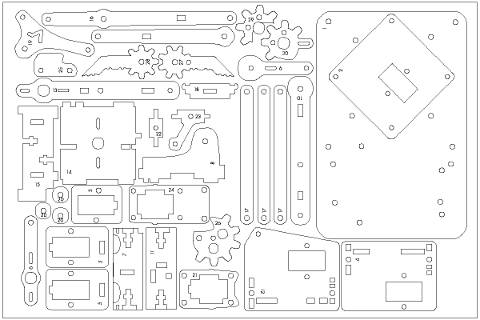

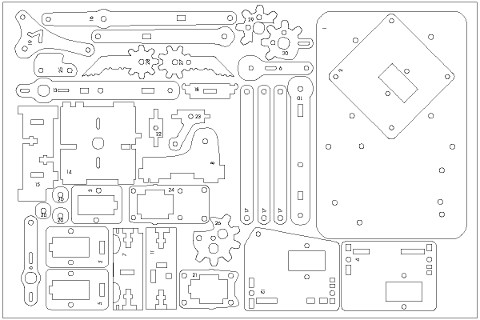

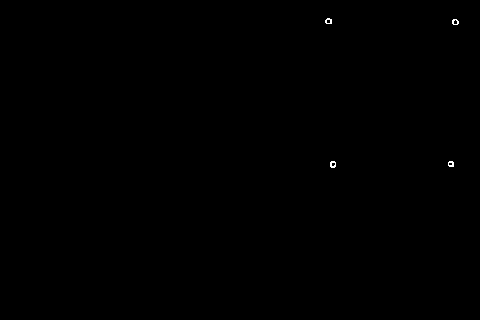

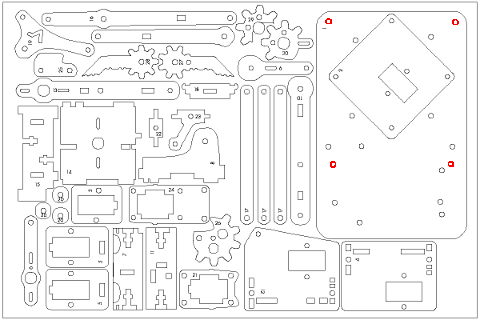

In [ ]:
import numpy as np, cv2

#--① 연산에 필요한 영상을 읽고 그레이스케일로 변환
img1 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/robot_arm1.jpg')
img2 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/robot_arm2.jpg')
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

#--② 두 영상의 절대값 차 연산
diff = cv2.absdiff(img1_gray, img2_gray)

#--③ 차 영상을 극대화 하기 위해 쓰레시홀드 처리 및 컬러로 변환
_, diff = cv2.threshold(diff, 1, 255, cv2.THRESH_BINARY)
diff_red = cv2.cvtColor(diff, cv2.COLOR_GRAY2BGR)
diff_red[:,:,2] = 0

#--④ 두 번째 이미지에 변화 부분 표시
spot = cv2.bitwise_xor(img2, diff_red)

#--⑤ 결과 영상 출력
cv2_imshow( img1)
cv2_imshow(img2)
cv2_imshow( diff)
cv2_imshow( spot)
cv2.waitKey()
cv2.destroyAllWindows()

위 ［예제 4-2이의 코드 ①은 연산에 필요한 두 영상을 읽어서 그레이 스케 일로 변환합 
니다. 코드 ②에서 그레이 스케일로 변환된 두 영상의 차영상을 구합니다. 그 차이를 극대화해서 표현하기 위해 코드 ③에서는 1보다 큰 값은 모두 255로 바꾸고 색상을 
표현하기 위해 컬러 스케일로 바꿉니다. 코드 ④는 원본 이미지의 어느 부분이 변경 
되었는지 표시해 주기 위해서 cv2.bitwise_xor() 연산을 합니다. 원본 이미지는 배 
경이 횐색이므로 255를 가지고 있고 차영상은 차이가 있는 빨간색 영역을 제외하고 
는 255이므로 XOR 연산을 하면 서로 다른 영역인 도면의 그림과 빨간색으로 표시된 
차영상 부분이 합성됩니다.


### 4.4.5이미지 합성과 마스킹
두 개 이상의 영상에서 특정 영역끼리 합성하기 위해서는 전경이 될 영상과 배경이 
될 영상에서 합성하고자 하는 영 역만 떼어내는 작업과 그것을 합하는 작업으로 나눌 
수 있습니다. 여기서 원하는 영역만을 떼어내는 데 꼭 필요한 것이 마스크(mask)입 
니다. 사람이 좌표를 입력하지 않고 정교한 마스크를 만드는 작업은 결코 쉽지 않습 
니다. 이것을 원하는 대로 하려면 앞으로 다뤄야 할 주제가 무척 많습니다. 사실 원 
하는 영역을 배경에서 떼어내는 작업은 객체 인식과 분리라는 컴퓨터 비전 분야의 
정점과도 같다고 볼 수 있습니다.
여기서는 우선 배경이 투명한 알파 채널 영상을 이용해서 영상을 합성해 봅니다. 
4.2절 “컬러 스페이스”에서 살펴본 것처럼 배경이 투명한 영상은 4개 채널 중 마지 
막 채널은 배경에 해당하는 영역은 0 값을，전경에 해당하는 영역은 255 값을 갖습니 
다. 이것을 이용하면 손쉽게 마스크를 만들 수 있습니다. 마스크를 이용해서 전경과 
배경을 오려내는 것은 앞서 살펴본 cv2.bitwise_and() 연산을 이용하면 쉽습니다.



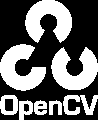

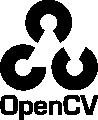

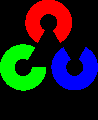

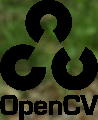

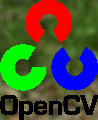

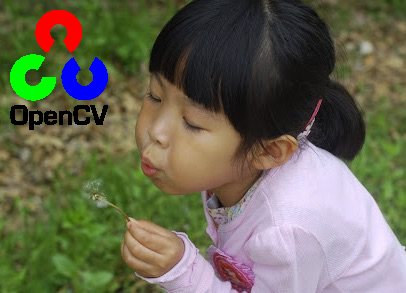

In [ ]:
import cv2
import numpy as np

#--① 합성에 사용할 영상 읽기, 전경 영상은 4채널 png 파일
img_fg = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/opencv_logo.png', cv2.IMREAD_UNCHANGED)
img_bg = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/girl.jpg')

#--② 알파채널을 이용해서 마스크와 역마스크 생성
_, mask = cv2.threshold(img_fg[:,:,3], 1, 255, cv2.THRESH_BINARY)
mask_inv = cv2.bitwise_not(mask)

#--③ 전경 영상 크기로 배경 영상에서 ROI 잘라내기
img_fg = cv2.cvtColor(img_fg, cv2.COLOR_BGRA2BGR)
h, w = img_fg.shape[:2]
roi = img_bg[10:10+h, 10:10+w ]

#--④ 마스크 이용해서 오려내기
masked_fg = cv2.bitwise_and(img_fg, img_fg, mask=mask)
masked_bg = cv2.bitwise_and(roi, roi, mask=mask_inv)

#--⑥ 이미지 합성
added = masked_fg + masked_bg
img_bg[10:10+h, 10:10+w] = added

cv2_imshow( mask)
cv2_imshow( mask_inv)
cv2_imshow( masked_fg)
cv2_imshow( masked_bg)
cv2_imshow( added)
cv2_imshow( img_bg)
cv2.waitKey()
cv2.destroyAllWindows() 

［예제 4~21］은 배경이 투명한 OpenCV 로고 이미지를 소녀의 사진과 합성하고 있습 
니다. 로고 이미지의 네 번째 채널이 배경과 전경을 분리할 수 있는 마스크 역할을 
해주므로 앞서 설명한 몇 가지 함수의 조합만으로 손쉽게 이미지를 합성할 수 있습 
니다.
모양에 따라 영역을 떼어내려는 경우도 있지만，색상에 따라 영역을 떼어내야 하 
는 경우도 있습니다. 이때는 색을 가지고 마스크를 만들어야 하는데，4.2절 “컬러 스 
페이스”에서 다룬 HSV로 변환하면 원하는 색상 범위의 것만 골라낼 수 있습니다. 
OpenCV는 특정 범위에 속하는지를 판단할 수 있는 함수를 아래와 같이 제공합니 
다. 이것을 이용하면 특정 범위 값을 만족하는 마스크를 만들기 쉽습니다.


• dst = cv2.inRange(img, from, to)： 범위에 속하지 않은 픽셀 판단

• img： 입력 영상

• from： 범위의 시작 배열

• to: 범위의 끝배열

• dst： img가 from ~ to에 포함되면 255, 아니면 0을 픽셀 값으로 하는 배 열


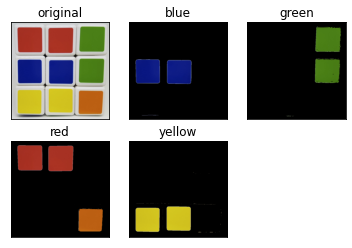

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--① 큐브 영상 읽어서 HSV로 변환
img = cv2.imread("/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/cube.jpg")
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

#--② 색상별 영역 지정
blue1 = np.array([90, 50, 50])
blue2 = np.array([120, 255,255])
green1 = np.array([45, 50,50])
green2 = np.array([75, 255,255])
red1 = np.array([0, 50,50])
red2 = np.array([15, 255,255])
red3 = np.array([165, 50,50])
red4 = np.array([180, 255,255])
yellow1 = np.array([20, 50,50])
yellow2 = np.array([35, 255,255])

# --③ 색상에 따른 마스크 생성
mask_blue = cv2.inRange(hsv, blue1, blue2)
mask_green = cv2.inRange(hsv, green1, green2)
mask_red = cv2.inRange(hsv, red1, red2)
mask_red2 = cv2.inRange(hsv, red3, red4)
mask_yellow = cv2.inRange(hsv, yellow1, yellow2)

#--④ 색상별 마스크로 색상만 추출
res_blue = cv2.bitwise_and(img, img, mask=mask_blue)
res_green = cv2.bitwise_and(img, img, mask=mask_green)
res_red1 = cv2.bitwise_and(img, img, mask=mask_red)
res_red2 = cv2.bitwise_and(img, img, mask=mask_red2)
res_red = cv2.bitwise_or(res_red1, res_red2)
res_yellow = cv2.bitwise_and(img, img, mask=mask_yellow)

#--⑤ 결과 출력
imgs = {'original': img, 'blue':res_blue, 'green':res_green, 
                            'red':res_red, 'yellow':res_yellow}
for i, (k, v) in enumerate(imgs.items()):
    plt.subplot(2,3, i+1)
    plt.title(k)
    plt.imshow(v[:,:,::-1])
    plt.xticks([]); plt.yticks([])
plt.show()

［예제 4-22】의 코드 ②에서 지정한 색상별 영역은 4.2절 “컬러 스페이스”에서 HSV의 각 색상별 영역에서 설명한 것을 근거로 작성하였습니다. 빨강은 180을 기점으로 둘 로 나뉘어(0 ~ 15,165-180) 있으므로 마스크 생성과 색상 추출에도 두 번씩 사용했습 니다. 코드 ③에서 cv2.inRange() 함수를 호출해서 각 색상 범위별 마스크를 만듭니 
다. 이 함수는 첫 번째 인자의 영상에서 두 번째와 세 번째 인자의 배 열 구간에 포함 되면 해당 픽셀의 값으로 255를 할당하고 그렇지 않으면 0을 할당합니다. 그래서 이 함수의 반환 결과는 바이너리 스케일이 되어 코드 ④의 cv2.bitwise_and() 함수의 mask로 사용하기 적합합니다. 이와 같이 색상을 이용한 마스크를 이용하는 것이 크로마 키 (chroma key)의 원리 
입니다. 일기 예보나 영화를 촬영할 때 초록색 또는 파란색 배경을 두고 찍어서 나중 에 원하는 배경과 합성하는 것을 크로마 키잉(chroma keying)이라고 하고 그 초록
색 배경을 크로마 키라고 합니다. 다음 ［예제 4~23］은 크로마 키를 배경으로 한 영상3 
에서 크로마 키 색상으로 마스크를 만들어 합성하는 예제입니다.


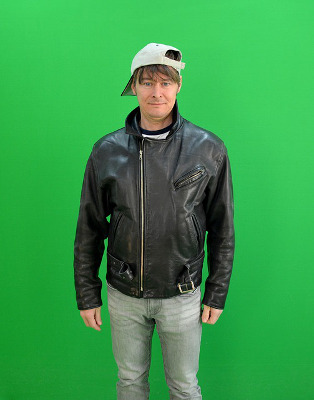

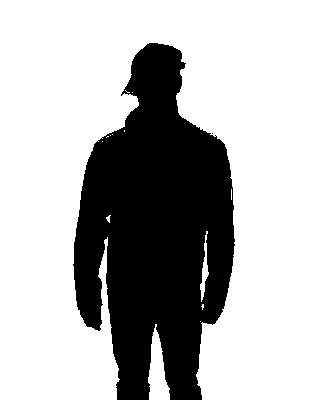

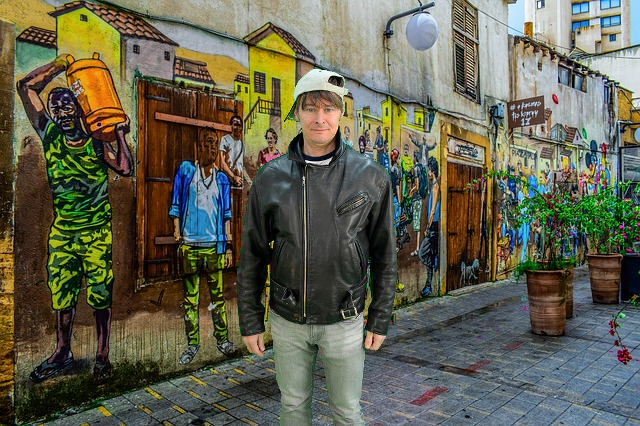

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--① 크로마키 배경 영상과 합성할 배경 영상 읽기
img1 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/man_chromakey.jpg')
img2 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/street.jpg')

#--② ROI 선택을 위한 좌표 계산
height1, width1 = img1.shape[:2]
height2, width2 = img2.shape[:2]
x = (width2 - width1)//2
y = height2 - height1
w = x + width1
h = y + height1

#--③ 크로마키 배경 영상에서 크로마키 영역을 10픽셀 정도로 지정
chromakey = img1[:10, :10, :]
offset = 20

#--④ 크로마키 영역과 영상 전체를 HSV로 변경
hsv_chroma = cv2.cvtColor(chromakey, cv2.COLOR_BGR2HSV)
hsv_img = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)

#--⑤ 크로마키 영역의 H값에서 offset 만큼 여유를 두어서 범위 지정
# offset 값은 여러차례 시도 후 결정
#chroma_h = hsv_chroma[0]
chroma_h = hsv_chroma[:,:,0]
lower = np.array([chroma_h.min()-offset, 100, 100])
upper = np.array([chroma_h.max()+offset, 255, 255])

#--⑥ 마스크 생성 및 마스킹 후 합성
mask = cv2.inRange(hsv_img, lower, upper)
mask_inv = cv2.bitwise_not(mask)
roi = img2[y:h, x:w]
fg = cv2.bitwise_and(img1, img1, mask=mask_inv)
bg = cv2.bitwise_and(roi, roi, mask=mask)
img2[y:h, x:w] = fg + bg

#--⑦ 결과 출력
cv2_imshow(img1)
cv2_imshow(mask)
cv2_imshow(img2)
cv2.waitKey()
cv2.destroyAllWindows()

［그림 4-2기은 왼쪽에 한 남자가 크로마 키를 배 경으로 찍은 사진을 어느 거 리를 찍은 사진과 합성한 것입니다. ［예제 4-23］의 코드 ②에서는 남자가 서 있는 왼쪽 끝 배경 10X10 픽셀 영역을 크로마 키가 있는 영역으로 어림잡아 지정했습니다. 이 영역의 색상 값 중에 가장 큰 값과 가장 작은 값을 범위로 지정해서 cv2.inRange() 함수를 사 
용하면 배경만 제거할 수 있습니다. 코드 ④에서는 앞서 어림잡아 선택한 영역의 색 상 값보다 더 넓은 영역의 색상을 선택할 수 있도록 offset만큼 가감하게 했고 그 수 
치는 결과를 확인하면서 경험적으로 얻어야 합니다. 크로마 키의 색상 값도 화면 전 체적으로는 조금씩 다를 수 있기 때문입니다. S와 V 값의 선택 범위도 마찬가지입니 
다. 나머지 마스킹과 합성 작업은 이전에 했던 것과 크게 다르지 않습니다.
이렇게 영상 합성에는 대부분 알파 블렌딩 또는 마스킹이 필요합니다. 하지만，이 
런 작업은 블렌딩을 위한 적절한 알파 값 선택과 마스킹을 위한 모양의 좌표나 색상 값 선택에 많은 노력과 시간이 필요합니다. Opend 3 버전에서 재미있는 함수를 
추가했는데，알아서 두 영상의 특징을 살려 합성하는 기능입니다. 이 함수의 설명은 
아래와 같습니다.


• dst = cv2.seam1essClone(src, dst, mask, coords, flags［, output］)

• src： 입 력 영상，일반적으로 전경 • dst： 대상 영상，일반적으로 배경

• mask： 마스크，src에서 합성하고자 하는 영 역은 255, 나머지는 0 

• coodrs： src가 놓여지기 원하는 dst의 좌표(중앙) 

• flags： 합성 방식 

**• cv2.NORMAL_CLONE： 입 력 원본 유지**

**• cv2.MIXED_CL0NE： 입 력과 대상을 혼합** 

• output： 합성 결과 

• dst： 합성 결과




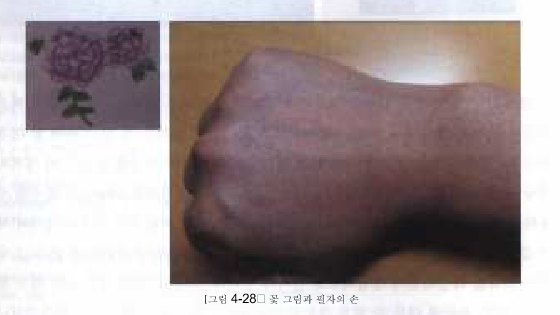

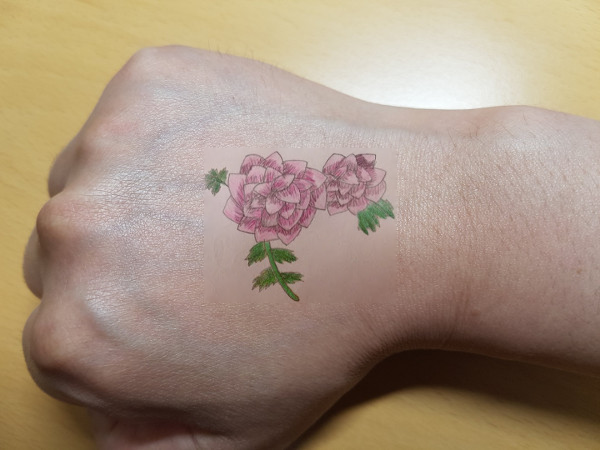

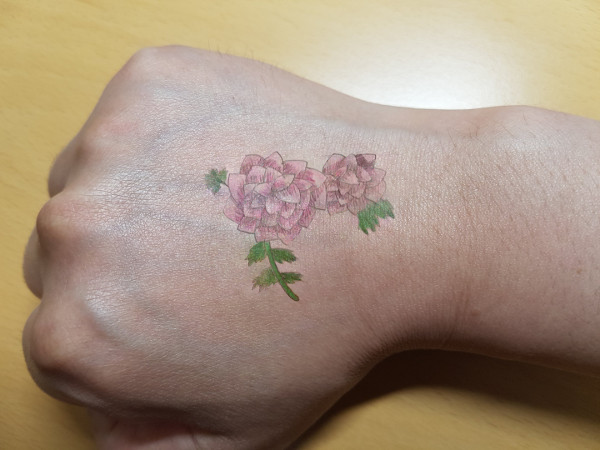

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt
 
#--① 합성 대상 영상 읽기
img1 = cv2.imread("/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/drawing.jpg")
img2= cv2.imread("/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/my_hand.jpg")

#--② 마스크 생성, 합성할 이미지 전체 영역을 255로 셋팅
mask = np.full_like(img1, 255)
 
#--③ 합성 대상 좌표 계산(img2의 중앙)
height, width = img2.shape[:2]
center = (width//2, height//2)
 
#--④ seamlessClone 으로 합성 
normal = cv2.seamlessClone(img1, img2, mask, center, cv2.NORMAL_CLONE)
mixed = cv2.seamlessClone(img1, img2, mask, center, cv2.MIXED_CLONE)

#--⑤ 결과 출력
cv2_imshow( normal)
cv2_imshow(mixed)
cv2.waitKey()
cv2.destroyAllWindows()

［예제 4-24］의 코드 ①이 이 예제의 핵심적인 코드입니다. imgl을 img2에다가 mask에 지정된 영역만큼 center 좌표에 합성합니다. 이때 mask는 imgl의 전체 영역을 255로 
채워서 해당 영역 전부가 합성의 대상임을 표현합니다. 가급적이면 합성하려는 영 역을 제외하고 0으로 채우는 것이 더 좋은 결과를 보여주지만 이번 예제에서는 일부 러 대충해 보았습니다. 결과로 나온 ［그림 4-29］를 보면 함수의 마지막 인자 플래그 가 cv2.N0RMAL_CL0NE인 경우 꽃 그림이 선명하긴 하지만，주변의 피부가 뭉개진 듯 한 결과를 보입니다. 반면에，cv2.MIXED_CLONE을 사용한 경우에는 감쪽같이 두 영상 
의 특징을 살려서 표현하고 있습니다. 이 함수는 이미지 합성에 꼭 필요한 알파 값이 
나 마스크에 대해 신경 쓰지 않아도 되서 무척 편리합니다.


##4.5 히스토그램
히스토그램(histogram)은 뭐가 몇 개 있는지 개수를 세어 놓은 것을 그림으로 표시 
한 것을 말합니다. 히스토그램은 영상을 분석하는 데 도움이 많이 됩니다.
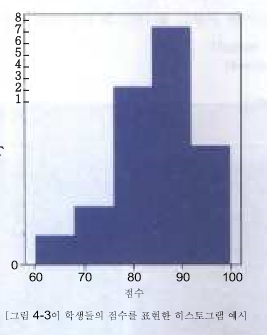


###4.5.1 히스토그램 계산과 표시

영상 분야에서의 히스토그램은 전체 영상에서 픽셀 값이 1인 픽셀이 몇 개이고 2인 픽셀이 몇 개이고 하는 식으로 픽셀 값이 255인 픽셀이 몇 개인지까지 세는 것을 말 
합니다. 그렇게 하는 이유는 전체 영상에서 픽셀들의 색상이나 명암의 분포를 파악 
하기 위해서입니다. OpenCV는 영상에서 히스토그램을 계산하는 cv2.calcHist() 함수를 제공합니다.

• cv2.calcHist(img, channel, mask, histSize, ranges) 

• img: 입 력 영상，[img]처 럼 리스트로 감싸서 표현 • channel： 처리할 채널，리스트로 감싸서 표현 

• 1채널: [0], 2채널: [0,1], 3채널: [0,1, 2] 

• mask： 마스크에 지정한 픽셀만 히스토그램 계산 

• histSize： 계급(bin)의 개수，채널 개수에 맞게 리스트로 표현 

• 1채널: [256], 2채널: [256, 256], 3채널: [256,256, 256] 

• ranges： 각 픽셀이 가질 수 있는 값의 범위，RGB인 경우 [0, 256]
가장 간단하게 그레이 스케일 이미지의 히스토그램을 계산해서 그려보겠습니다.


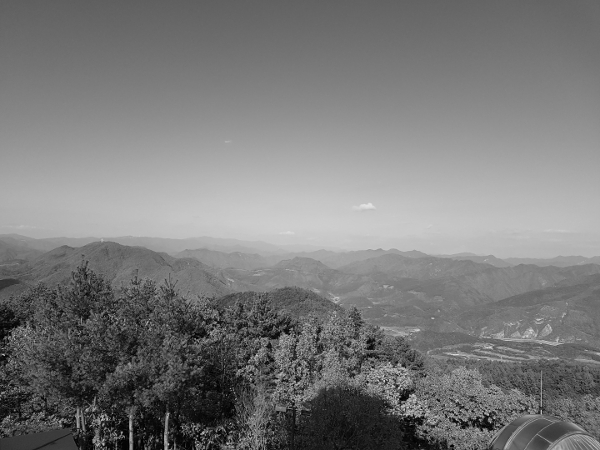

hist.shape: (256, 1)
hist.sum(): 270000.0 img.shape: (450, 600)


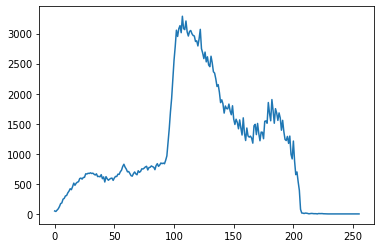

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--① 이미지 그레이 스케일로 읽기 및 출력
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/mountain.jpg', cv2.IMREAD_GRAYSCALE)
cv2_imshow( img)

#--② 히스토그램 계산 및 그리기
hist = cv2.calcHist([img], [0], None, [256], [0,255])
plt.plot(hist)

print("hist.shape:", hist.shape)  #--③ 히스토그램의 shape (256,1)
print("hist.sum():", hist.sum(), "img.shape:",img.shape) #--④ 히스토그램 총 합계와 이미지의 크기
plt.show()

[예제 4-25]는 영상을 그레이 스케 일로 읽 어서 1차원 히스토그램으로 출력하는 예제 입니다. 코드 ②가 가장 핵심적인 코드입니다. 여기서 cv2.calcHist() 함수 호출에 사용한 인자를 순서대로 설명하면，**히스토그램 대상 이미지는 [img], 1채널만 있어 서 [0], 마스크는 사용하지 않으므로 None, 가로축(x축)에 표시할 계급(bin)의 개수 는 [256], 픽셀 값 중 최소 값과 최대 값은 [0, 256]이라는 의미**입니다. 여기서 최대 값은 범위에 포함되지 않으므로 255보다 1 큰 값을 전달합니다. 이렇게 얻은 결과를 plt.plotO 함수에 전달하면 아래 [그림 4>31]과 같이 히스토그램을 그림으로 보여줍 
니다.


［예제 4_25］의 코드 ③에서 출력한 히스토그램 배열의 shape는 (256, 1》입니다. 256 
개의 계급에 각각 픽셀 수가 몇 개인지 저장한 모양새입니다. 코드 ④에서는 히스토 
그램의 전체 합과 이미지의 크기를 출력하고 있는데，이 값으로 이미지의 폭과 높이 의 곱과 히스토그램의 합(450 x600 = 270,000)이 같은 것을 알 수 있습니다. 그레이 스케일이 아닌 컬러 스케일에 대한 히스토그램은 3개 채널，즉 R, G, B를 
각각 따로 계산해서 그려볼 수 있습니다.


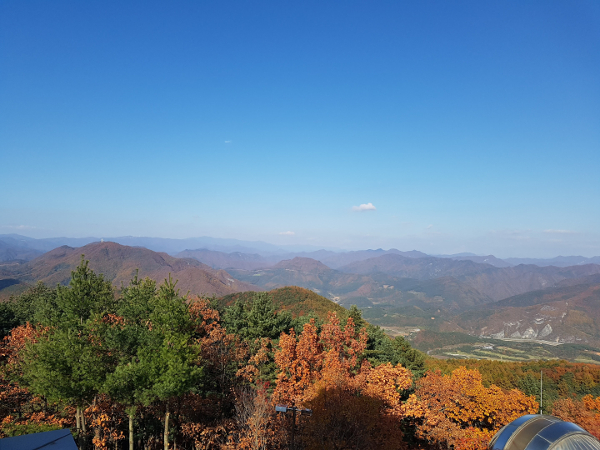

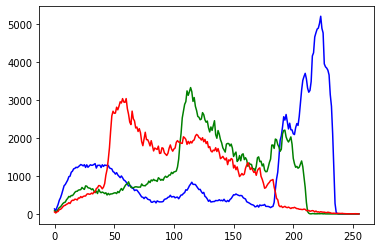

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--① 이미지 읽기 및 출력
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/mountain.jpg')
cv2_imshow( img)

#--② 히스토그램 계산 및 그리기
channels = cv2.split(img)
colors = ('b', 'g', 'r')
for (ch, color) in zip (channels, colors):
    hist = cv2.calcHist([ch], [0], None, [256], [0, 255])
    plt.plot(hist, color = color)
plt.show()

［예제 4_26］은 컬러 스케일 이미지의 3개 채널에 대해서 1차원 히스토그램을 각각 구 
하고 나서 하나의 플롯에 그렸습니다. 히스토그램을 보면 파란 하늘이 가장 넓은 영 
역을 차지하고 있으므로 파란색 분포가 크고 초록 나무와 단풍 때문에 초록색과 빨 
간색의 분포가 그 뒤를 따르는 것으로 보입니다.


###4.5.2 노멀라이즈

노멀라이즈（normalize, 정규화）는 원래 기준이 서로 다른 값을 같은 기준이 되게 만 드는 것을 말합니다. 예를 들어 영수는 A학교를 다니는데 비슷한 난이도의 시험에서 20문제 중에 문제를 맞혔고 영희는 B학교를 다니는데 25문제 중 20문제를 맞혔습 
니다. 이때 영희가 영수보다 한 문제를 더 맞혔으니 성적이 더 좋다고 말할 수는 없 습니다. 두 학생의 시험 문제 수가 서로 다르기 때문에 100점으로 환산해서 비교해 야 하는데，이것이 대표적인 노멀라이즈입니다. 100점으로 노멀라이즈를 하고 나면 영수는 95점 이고 영회는 80점으로 성적은 영수가 더 좋다고 봐야 합니다.
노멀라이즈는 이렇게 서로 다른 기준을 하나의 절대적인 기준으로 만들기도 하 
지만 절대적인 기준 대신 특정 구간으로 노멀라이즈하면 특정 부분에 몰려 있는 값 을 전체 영 역으로 골고루 분포하게 할 수도 있습니다. 예를 들어 전교생이 5명인 학 생들의 성적이 95, 96, 98, 98, 100점일 때 95점 이상에게 A+ 학점을 준다면 전교 생이 A+를 받게 되니 이 시험엔 분명 문제가 있습니다. 선생님이 각 학생의 점수를 70~100점 사이로 다시 환산하고 싶어 한다면，이때 필요한 것이 바로 구간 노멀라이 
즈입니다. 원래 점수는 95-100, 즉 5점 간격이었는데，새로운 점수는 70-100, 즉 30점 간격 이므로 30 4-5 = 6으로 원래 점수 1점 차이는 새로운 점수 6점 차이가 됩니다. 원래 점수가 5점 구간에서 얼마인지 찾아 그 비율（6점）과 곱해서 새로운 시작 구간（70점） 
에 더하면 새로운 점수를 구할 수 있습니다. 이것을 수학식으로 정리하면 다음과 같 
습니다.



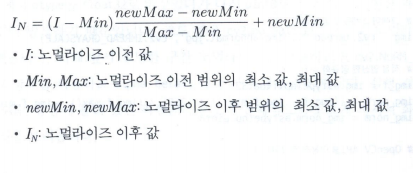

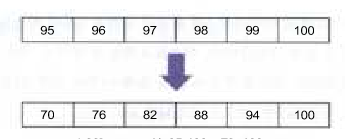

영상 분야에서는 노멀라이즈를 가지고 픽셀 값들이 0~255에 골고루 분포하지 않고 
특정 영역에 몰려 있는 경우 화질을 개선하기도 하고 영상 간의 연산을 해야 하는데， 
서로 조건이 다른 경우 같은 조건으로 만들기도 합니다. OpenCV는 노멀라이즈 기능을 아래와 같은 함수로 제공합니다.
  
• dst = cv2.normalize(src, dst, alpha, beta, type_flag) 

• src: 노멀라이즈 이전 데이터 

• dst： 노멀라이즈 이후 데이터 

• alpha: 노멀라이즈 구간 1 

• beta： 노멀라이즈 구간 2, 구간 노멀라이즈가 아닌 경우 사용 안 함 

• type.flag： 알고리즘 선택 플래그 상수 

• cv2.N0RM_MINMAX： alpha와 beta 구간으로 노멀라이즈 

• cv2.N0RM_Ll： 전체 합으로 나누기，alpha = 노멀라이즈 전체 합 

• cv2.N0RMJ_2: 단위 벡터 (unit vector)로 노멀라이즈 

• cv2.N0RM_INF： 최대 값으로 나누기


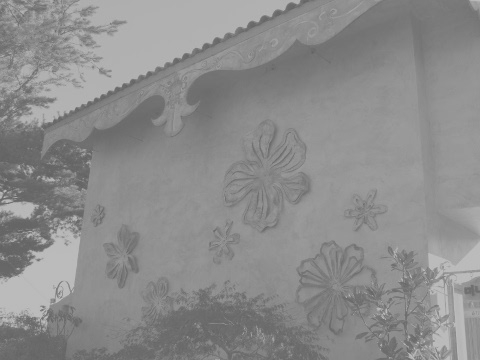

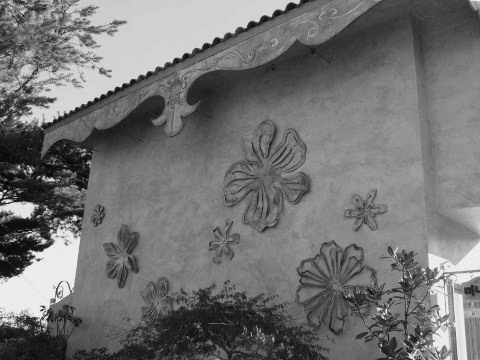

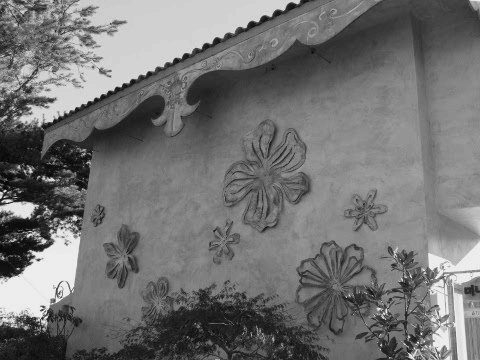

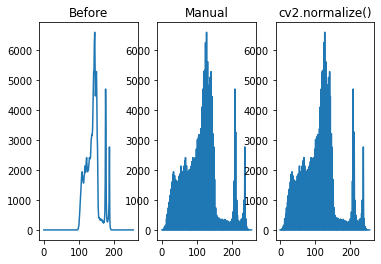

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--① 그레이 스케일로 영상 읽기
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/abnormal.jpg', cv2.IMREAD_GRAYSCALE)

#--② 직접 연산한 정규화
img_f = img.astype(np.float32)
img_norm = ((img_f - img_f.min()) * (255) / (img_f.max() - img_f.min()))
img_norm = img_norm.astype(np.uint8)

#--③ OpenCV API를 이용한 정규화
img_norm2 = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)

#--④ 히스토그램 계산
hist = cv2.calcHist([img], [0], None, [256], [0, 255])
hist_norm = cv2.calcHist([img_norm], [0], None, [256], [0, 255])
hist_norm2 = cv2.calcHist([img_norm2], [0], None, [256], [0, 255])

cv2_imshow( img)
cv2_imshow( img_norm)
cv2_imshow( img_norm2)

hists = {'Before' : hist, 'Manual':hist_norm, 'cv2.normalize()':hist_norm2}
for i, (k, v) in enumerate(hists.items()):
    plt.subplot(1,3,i+1)
    plt.title(k)
    plt.plot(v)
plt.show()


［예제 4-2기의 코드 ②는 앞서 설명한 노멀라이즈 공식을 직접 대입해서 연산하였습 니다. 코드 ②에서 dtype을 float32로 바꾸었다가 다시 uint8로 바꾼 이유는 연산 과 정에서 **소수점이 발생**하기 때문입니다. 코드 ③은 cv2.normalize() 함수로 노멀라 이즈를 적용했습니다. 이때 앞서 설명한 구간 노멀라이즈를 사용하려면 cv2.N0RM_ MINMAX 플래그 상수를 사용하고 alpha, beta는 대상 구간 값을 전달합니다. 실행 결 과인 ［그림 4_34］는 중앙에 몰려 있던 **픽셀들의 분포가 전체적으로 고르게 펴져서 화질이 개선된 것을 보여줍니다. **

구간 노멀라이즈가 아니라 서로 다른 히스토그램의 빈도를 같은 조건으로 비교하 
는 경우에는 전체의 비율로 노멀라이즈해야 하는데，이때 코드는 다음과 같습니다. 


norm = cv2.normalize(hist, None, 1, 0, cv2.N0RM_Ll)

위 코드에서 cv2.N0RM_Ll 플래그 상수를 사용하면 결과는 전체를 모두 합했을 때 1이 됩니다. 세 번째 인자 값에 따라 그 합은 달라지고 네 번째 인자는 무시됩니다.


###4.5.3 이퀄라이즈
앞서 설명한 노멀라이즈는 분포가 한곳에 집중되어 있는 경우에는 효과적이지만 그 
집중된 영역에서 멀리 떨어진 값이 있을 경우에는 효과가 없습니다. 다시 학생들 점 수를 예로 들면 전교생 5명의 점수가 70, 96, 98, 98,100으로 나왔다면 첫 번째 학생 의 점수가 70점이므로 구간 노멀라이즈로는 새로운 70-100 분포로 만들어도 결과 
는 동일한데，기존의 범위와 새로운 범위가 같기 때문입니다. 이때에는 이월라이즈 (equalize, 평탄화)가 필요합니다.
이퀄라이즈는 히스토그램으로 빈도를 구해서 그것을 노멀라이즈한 후 누적값을 
전체 개수로 나누어 나온 결과 값을 히스토그램 원래 픽셀 값에 매핑합니다. 히스토 
그램 이월라이즈를 위한 수학식은 아래와 같습니다.


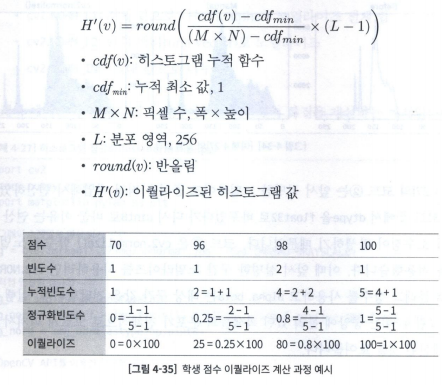

이월라이즈는 각각의 값이 전체 분포에 차지하는 비중에 따라 분포를 재분배하므로 
명암 대비(contrast)를 개선하는 데 효과적입니다. OpenCV에서 제공하는 이월라이즈 함수는 아래와 같습니다.

• dst = cv2.equalizeHist(sre [f dst]) 

• sre： 대상 이미지，8비트 1 채널 

• dst： 결과 이미지

[예제 128]은 어둡게 나온 사진을 그레이 스케일로 바꾸어 이월라이즈를 적용해서 
개선시키는 예제입니다

(256,)


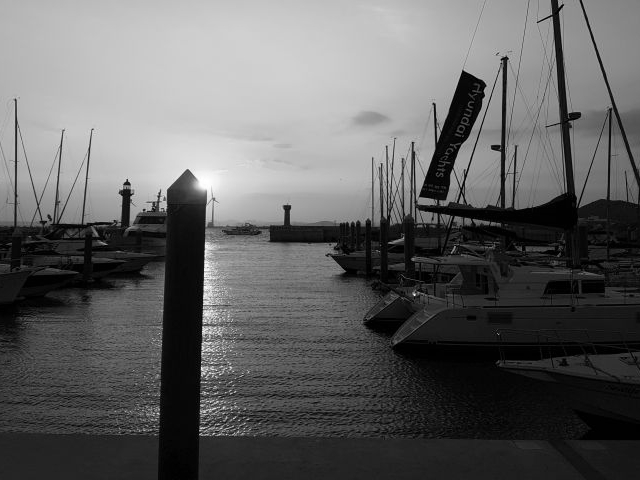

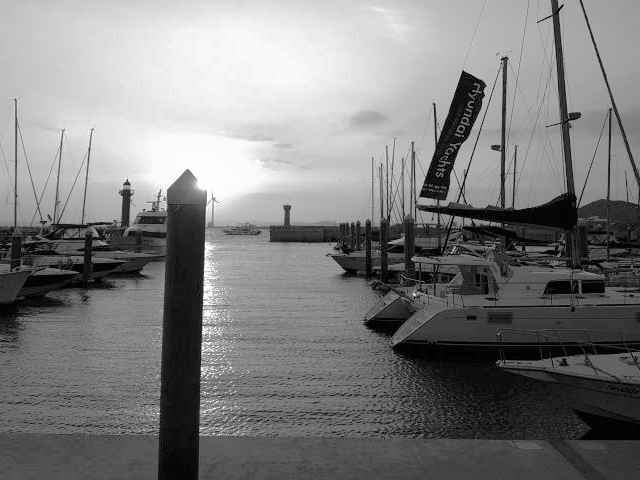

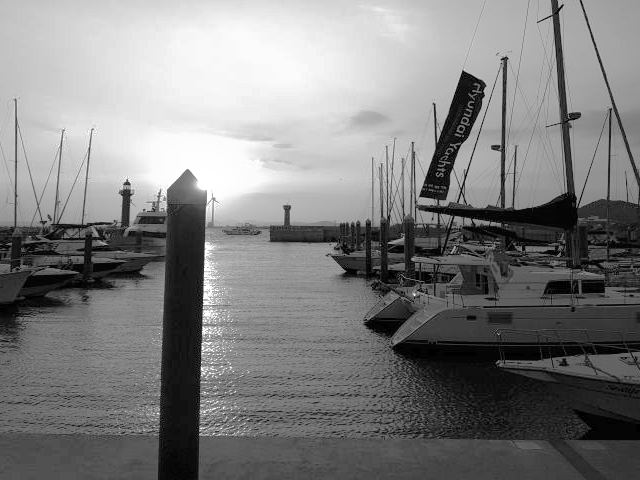

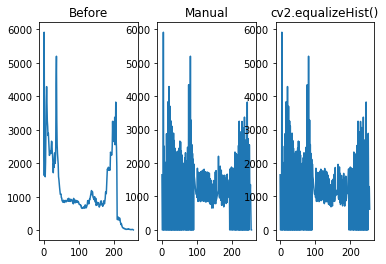

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--① 대상 영상으로 그레이 스케일로 읽기
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/yate.jpg', cv2.IMREAD_GRAYSCALE)
rows, cols = img.shape[:2]

#--② 이퀄라이즈 연산을 직접 적용
hist = cv2.calcHist([img], [0], None, [256], [0, 256]) #히스토그램 계산
cdf = hist.cumsum()                                     # 누적 히스토그램 
cdf_m = np.ma.masked_equal(cdf, 0)                      # 0(zero)인 값을 NaN으로 제거
cdf_m = (cdf_m - cdf_m.min()) /(rows * cols) * 255      # 이퀄라이즈 히스토그램 계산
cdf = np.ma.filled(cdf_m,0).astype('uint8')             # NaN을 다시 0으로 환원
print(cdf.shape)
img2 = cdf[img]                                         # 히스토그램을 픽셀로 맵핑

#--③ OpenCV API로 이퀄라이즈 히스토그램 적용
img3 = cv2.equalizeHist(img)

#--④ 이퀄라이즈 결과 히스토그램 계산
hist2 = cv2.calcHist([img2], [0], None, [256], [0, 256])
hist3 = cv2.calcHist([img3], [0], None, [256], [0, 256])

#--⑤ 결과 출력
cv2_imshow(img)
cv2_imshow(img2)
cv2_imshow( img3)
hists = {'Before':hist, 'Manual':hist2, 'cv2.equalizeHist()':hist3}
for i, (k, v) in enumerate(hists.items()):
    plt.subplot(1,3,i+1)
    plt.title(k)
    plt.plot(v)
plt.show()

［예제 4-2到의 코드 ②는 히스토그램 이월라이즈 수식을 그대로 연산에 적용하고 있 습니다. hist.cumsum()은 누적합을 구하는 함수이고，np.ma.masked_equal(cdf, 0) 은 요소 값이 0인 것을 NaN으로 적용하는데，불필요한 연산을 줄이고자 하는 이유입 니다. 이것을 다시 원래대로 되돌리는 기능이 np.ma.fiUed(cdf_m,0》입니다. img2 = cdf ［img］는 연산 결과를 원래의 픽셀 값에 매핑합니다. 이렇게 복잡한 연산에 OpenCV에서 제공하는 API를 사용하면 코드 ③처럼 단 한 줄이면 끝납니다. 실행 결과를 보면 직접 계산을 적용한 결과와 cv2.equalizeHist() 
함수를 사용한 것 모두 밝기가 개선된 것을 알 수 있습니다.
히스토그램 이월라이즈는 컬러 스케일에도 적용할 수 있는데，밝기 값을 개선하기 
위해서는 3개 채널 모두를 개선해야 하는 BGR 컬러 스페이스보다는 YUV나 HSV로 
변환해서 밝기 채널만을 연산해서 최종 이미지에 적용하는 것이 좋습니다. ［예제 4-29］는 YUV 컬러 스페이스로 변경한 컬러 이미지에 대한 이퀄라이즈를 보 
여줍니다.


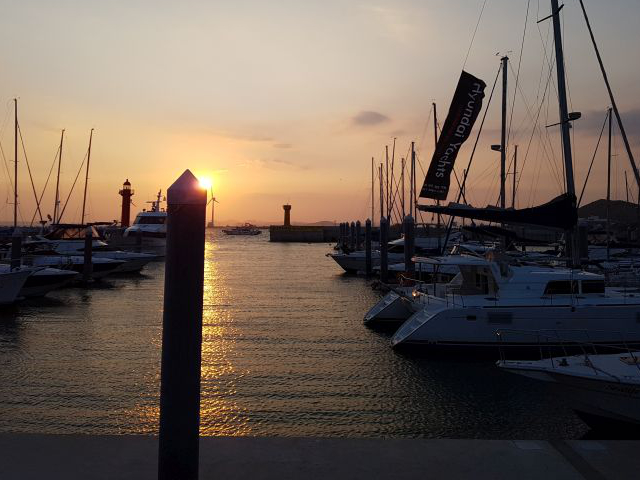

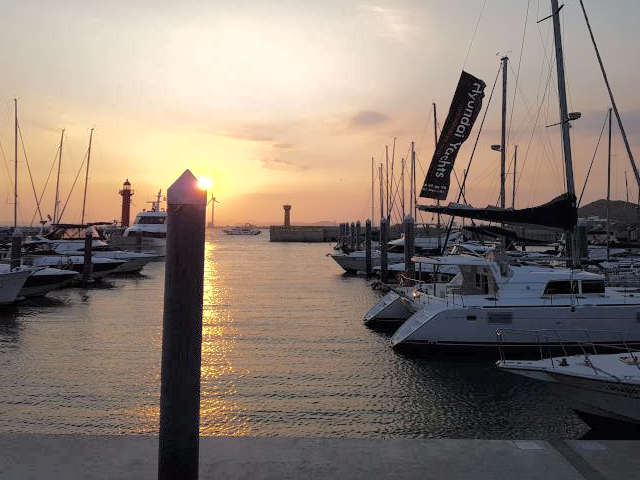

In [ ]:
import numpy as np, cv2

img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/yate.jpg') #이미지 읽기, BGR 스케일

#--① 컬러 스케일을 BGR에서 YUV로 변경
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV) 

#--② YUV 컬러 스케일의 첫번째 채널에 대해서 이퀄라이즈 적용
img_yuv[:,:,0] = cv2.equalizeHist(img_yuv[:,:,0]) 

#--③ 컬러 스케일을 YUV에서 BGR로 변경
img2 = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR) 

cv2_imshow( img)
cv2_imshow( img2)
cv2.waitKey()
cv2.destroyAllWindows()

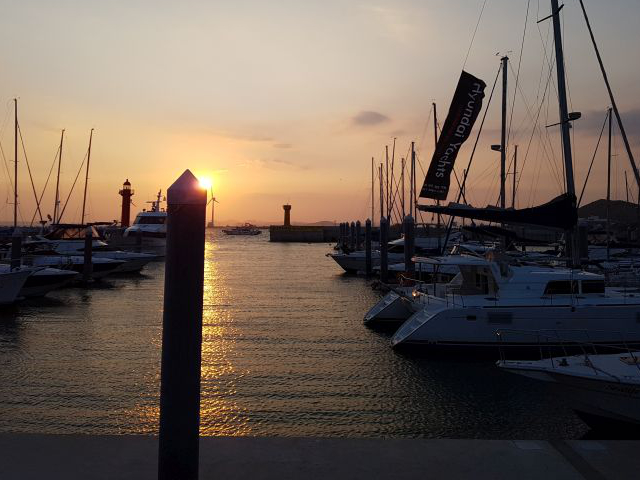

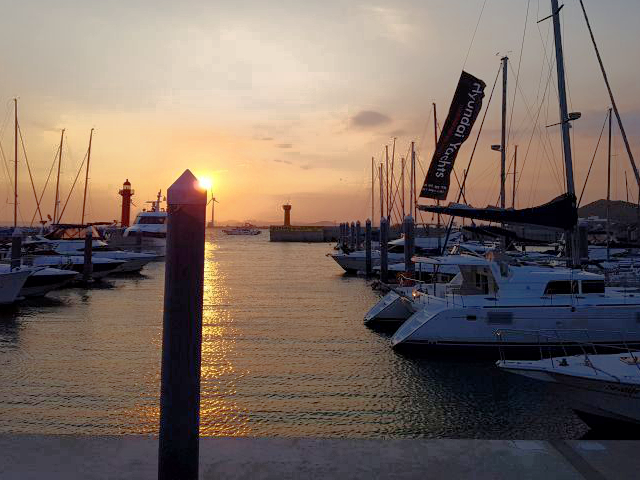

In [ ]:
import numpy as np, cv2

img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/yate.jpg') #이미지 읽기, BGR 스케일

#--① 컬러 스케일을 BGR에서 HSV로 변경
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 

#--② YUV 컬러 스케일의 첫번째 채널에 대해서 이퀄라이즈 적용
img_hsv[:,:,2] = cv2.equalizeHist(img_hsv[:,:,2]) 

#--③ 컬러 스케일을 HSV에서 BGR로 변경
img2 = cv2.cvtColor(img_hsv, cv2.COLOR_HSV2BGR) 

cv2_imshow( img)
cv2_imshow( img2)
cv2.waitKey()
cv2.destroyAllWindows()

[그림 4-3기의 요트 부분을 비교해서 보면 훨씬 선명한 결과를 얻은 것을 볼 수 있습 니다. HSV의 세 번째 채널에 대해서 이퀄라이즈를 적용해도 비슷한 결과를 얻을 수 있습니다. [예제 4-29]의 코드 ②를 HSV 컬러 스페이스에 적용하면 코드는 아래와 
같습니다.
img_hsv[:,:,2] = cv2.equalizeHist(img_hsv[:,:,2])


###4.5.4 CLAHE
CLAHE(Contrast Limiting Adaptive Histogram Equalization)는 영상 전체 에 이월 
라이즈를 적용했을 때 너무 밝은 부분이 날아가는 현상을 막기 위해 영상을 일정한 
영역으로 나눠서 이월라이즈를 적용하는 것을 말합니다. 노이즈가 증폭되는 것을 막 기 위해 어느 히스토그램 계급(bin)이든 지정된 제한 값을 넘으면 그 픽셀은 다른 계 
급으로배분하고나서 이월라이즈를 적용합니다.


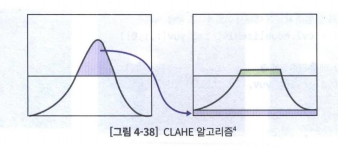

CLAHE를 위한 OpenCV 함수는 다음과 같습니다.

• clahe = cv2.createCLAHE(clipLimit, tileGridSize)： CLAHE 생성 

• clipLimit： Contrast 제한 경계 값，기본 40.0 


• tileGridSize： 영 역 크기，기본 8 X 8 

• clahe： 생성된 CLAHE 객체 • clahe.apply(sre)： CLAHE 적용 


• sre： 입력 영상


CLAHE를 적용하기 위한 핵심 코드만 나타내면 다음과 같습니다.

clahe = cv2.createCLAHE() 

img2= clahe.apply(img)


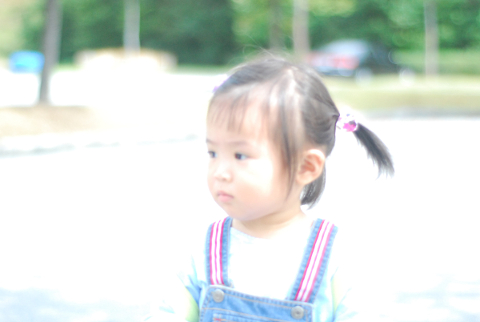

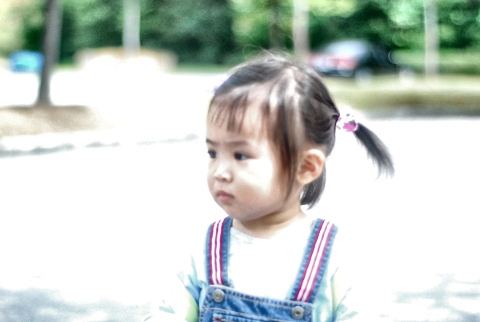

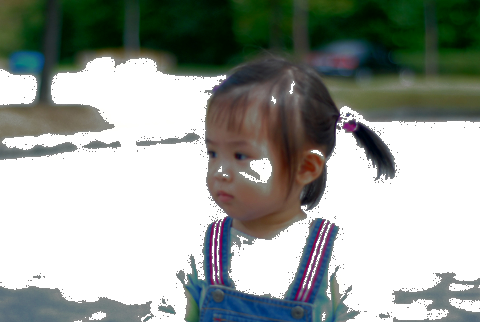

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

#--①이미지 읽어서 YUV 컬러스페이스로 변경
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/bright.jpg')
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

#--② 밝기 채널에 대해서 이퀄라이즈 적용
img_eq = img_yuv.copy()
img_eq[:,:,0] = cv2.equalizeHist(img_eq[:,:,0])
img_eq = cv2.cvtColor(img_eq, cv2.COLOR_YUV2BGR)

#--③ 밝기 채널에 대해서 CLAHE 적용
img_clahe = img_yuv.copy()
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)) #CLAHE 생성
img_clahe[:,:,0] = clahe.apply(img_clahe[:,:,0])           #CLAHE 적용
img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_YUV2BGR)

#--④ 결과 출력
cv2_imshow( img)
cv2_imshow( img_clahe)
cv2_imshow(img_eq)
cv2.waitKey()
cv2.destroyAllWindows()

［예제 4-30］의 코드 ②는 단순한 이퀄라이즈를 적용했고 코드 ③은 CLAHE를 적용 했습니다. cv2.createCLAHE()에서 clipLimit=3.0은 기본 값이 40.0이므로 상황에 따라 적절한 값으로 바꾸어야 합니다. ［그림 4-39］의 왼쪽 사진이 원본 사진으로，사진을 찍을 때 빛이 너무 많이 들어 갔습니다. 가운데가 CLAHE를 적용한 결과이고 오른쪽 
이 단순한 이퀄라이즈를 적용한 결과입니다. 이퀄라이즈를 적용한 결과는 밝은 곳이 
날아가는 증상이 발생한 것을 보여주고 있습니다

###4.5.5 2D 히스토그램
1차원 히스토그램은 각 픽셀이 몇 개씩인지 세어서 그래프로 표현하는데，2차원 히 스토그램은 이와 같은 축이 2개이고 각각의 축이 만나는 지점의 개수를 표현합니다. 그래서 이것을 적절히 표현하려면 지금까지 사용한 2차원 그래프가 아닌 3차원 그 
래프가 필요합니다. 이것을 시각화하려는 것이 이 책의 목적이 아니므로 여기서는 이미지로 표시하겠습니다. 아래의 ［예제 4-31］은 ［그림 4~32］의 맑고 화창한 가을 하 늘의 산을 찍은 사진을 2차원 히스토그램으로 표현한 것입니다.


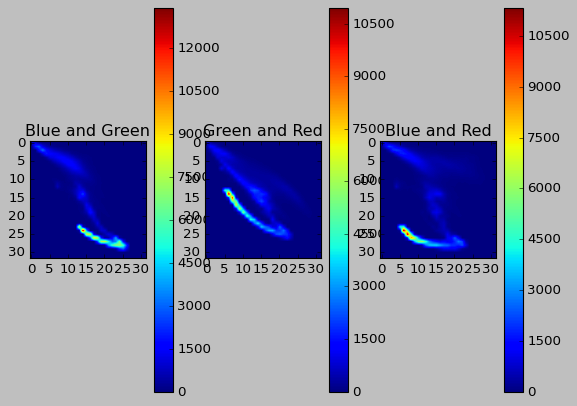

In [ ]:
import cv2
import matplotlib.pylab as plt

plt.style.use('classic')            # --①컬러 스타일을 1.x 스타일로 사용
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/mountain.jpg')

plt.subplot(131)
hist = cv2.calcHist([img], [0,1], None, [32,32], [0,256,0,256]) #--②
p = plt.imshow(hist)                                            #--③
plt.title('Blue and Green')                                     #--④
plt.colorbar(p)                                                 #--⑤


plt.subplot(132)
hist = cv2.calcHist([img], [1,2], None, [32,32], [0,256,0,256]) #--⑥
p = plt.imshow(hist)
plt.title('Green and Red')
plt.colorbar(p)

plt.subplot(133)
hist = cv2.calcHist([img], [0,2], None, [32,32], [0,256,0,256]) #--⑦
p = plt.imshow(hist)
plt.title('Blue and Red')
plt.colorbar(p)

plt.show()

［예제 4-31］의 코드 ②，⑥，⑦은 각각 파랑과 초록，초록과 빨강，파랑과 빨강에 대한 2차원 히스토그램을 계산합니다. 계급 수는 256으로 조밀하게 하면 색상이 너무 작 게 표현되서 32 정도로 큼직하게 잡았습니다. 각 값의 범위는 0〜256이 두 번 반복됨 니다. 계산한 히스토그램을 코드 ③에서 imshow() 함수로 표현했습니다. 그래서 이 
결과를 보면서 정확한 정보를 읽는 것은 그다지 도움이 되지는 않습니다. 다만，코드 ⑤에서 각 색상에 대한 컬러 막대를 범례(legend)로 표시했기 때문에 색상을 보면서 
대략의 정보를 알아낼 수 있습니다. 빨간색으로 표시될수록 픽셀의 개수가 많고 파란색은 픽셀이 적은 것을 나타냅니다.


여기서 중요한 것은 2차원 히스토그램의 의미입니다. ［그림 4-40]의 왼쪽 그림은 파랑과 초록의 2차원 히스토그램인데, 가장 높은 값을 갖는 부분은 빨간색으로 표시 된 x = 15, y = 25 정도의 좌표로 대략 10,000 이상의 값을 갖습니다. 이 의미는 파란 
색이면서 초록색인 픽셀의 개수가 가장 많다는 의미입니다. ［그림 4-40]의 중간과 오른쪽 그림을 봐도 초록과 파랑의 수치가 높은 것을 알 수 있습니다. 2차원 히스토그 램의 의미는 표축이면서 y축인 픽셀의 분포를 알 수 있다는 것입니다. 논리 연산의 AND 연산과 같습니다.


###4.5.6 역투영
2차원 히스토그램과 HSV 컬러 스페이스를 이용하면 색상으로 특정 물체나 사물의 일부분을 배경에서 분리할 수 있습니다. 기본 원리는 물체가 있는 관심영역의 H와 V 값의 분포를 얻어낸 후 전체 영상에서 해당 분포의 픽셀만 찾아내는 것입니다. ［예 제 4-32］에서는 마우스로 선택한 특정 물체만 배경에서 분리해 내는 모습을 보여주 
고 있습니다.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

win_name = 'back_projection'
img = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/pump_horse.jpg')
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
draw = img.copy()

#--⑤ 역투영된 결과를 마스킹해서 결과를 출력하는 공통함수
def masking(bp, win_name):
    disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
    cv2.filter2D(bp,-1,disc,bp)
    _, mask = cv2.threshold(bp, 1, 255, cv2.THRESH_BINARY)
    result = cv2.bitwise_and(img, img, mask=mask)
    cv2_imshow(win_name, result)

#--⑥ 직접 구현한 역투영 함수
def backProject_manual(hist_roi):
    #--⑦ 전체 영상에 대한 H,S 히스토그램 계산
    hist_img = cv2.calcHist([hsv_img], [0,1], None,[180,256], [0,180,0,256])
    #--⑧ 선택영역과 전체 영상에 대한 히스토그램 그램 비율계산
    hist_rate = hist_roi/ (hist_img + 1)
    #--⑨ 비율에 맞는 픽셀 값 매핑
    h,s,v = cv2.split(hsv_img)
    bp = hist_rate[h.ravel(), s.ravel()]
    bp = np.minimum(bp, 1)
    bp = bp.reshape(hsv_img.shape[:2])
    cv2.normalize(bp,bp, 0, 255, cv2.NORM_MINMAX)
    bp = bp.astype(np.uint8)
    #--⑩ 역 투영 결과로 마스킹해서 결과 출력
    masking(bp,'result_manual')
 
# OpenCV API로 구현한 함수 ---⑪ 
def backProject_cv(hist_roi):
    # 역투영 함수 호출 ---⑫
    bp = cv2.calcBackProject([hsv_img], [0, 1], hist_roi,  [0, 180, 0, 256], 1)
    # 역 투영 결과로 마스킹해서 결과 출력 ---⑬ 
    masking(bp,'result_cv')

# ROI 선택 ---①
(x,y,w,h) = cv2.selectROI(win_name, img, False)
if w > 0 and h > 0:
    roi = draw[y:y+h, x:x+w]
    cv2.rectangle(draw, (x, y), (x+w, y+h), (0,0,255), 2)
    #--② 선택한 ROI를 HSV 컬러 스페이스로 변경
    hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)
    #--③ H,S 채널에 대한 히스토그램 계산
    hist_roi = cv2.calcHist([hsv_roi],[0, 1], None, [180, 256], [0, 180, 0, 256] )
    #--④ ROI의 히스토그램을 매뉴얼 구현함수와 OpenCV 이용하는 함수에 각각 전달
    backProject_manual(hist_roi)
    backProject_cv(hist_roi)
cv2_imshow(win_name, draw)
cv2.waitKey()
cv2.destroyAllWindows()

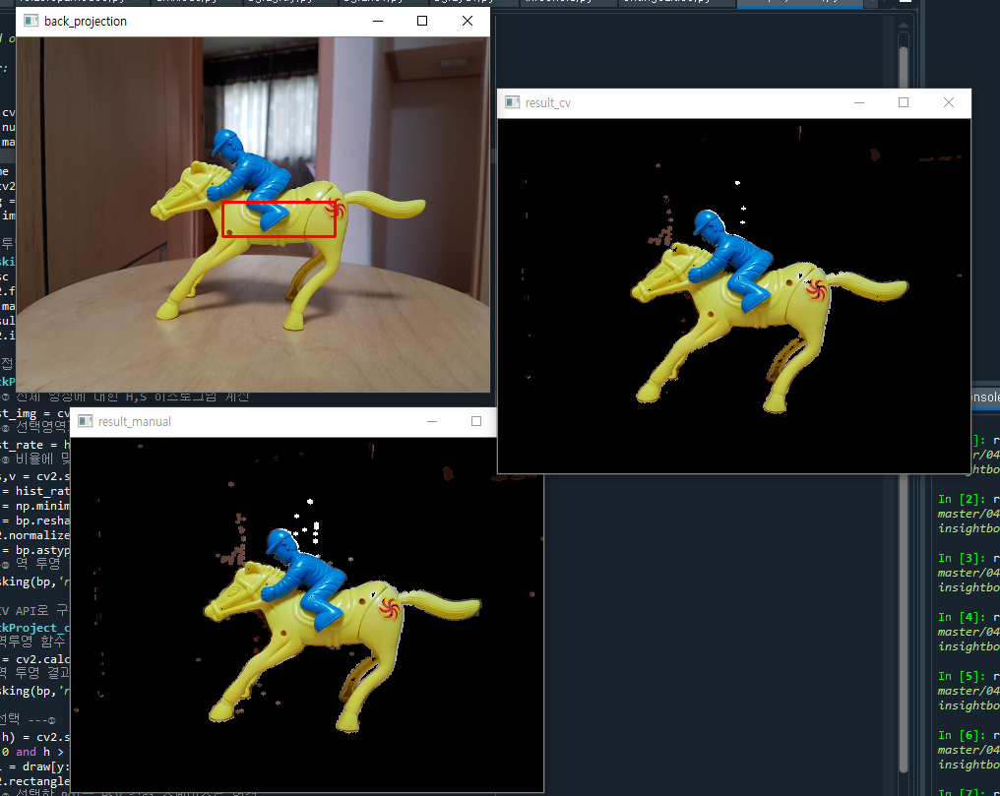

［그림 4-41］은 가운데에 있는 장난감 말 원본 영상의 중앙에 마우스로 영역을 선택한 모습입니다. 왼쪽과 오른쪽 영상은 OpenCV 함수와 직접 구현한 함수의 역투영(back projection) 결과를 각각 보여줍니다. 코드 ①에서 마우스로 ROI를 선택하게 합니다. ROI를 선택하고 스페이스나 엔터 키를 누르면 코드 ②에서 선택한 관심영역을 HSV 컬러 스페이스로 변경하고，코드 ③에서 H와 S채널에 대한 2차원 히스토그램을 계산 한 결과를 직접 구현한 함수와 OpenCV를 이용한 함수에 인자로 전달합니다.
먼저 코드 ⑥의 직접 구현한 함수를 살펴보면，코드 ⑥에서 전달된 관심 영역의 히 
스토그램을 전체 영상의 히스토그램으로 나누어 비율을 구합니다. 이때 1을 더한 이 
유는 분모가 0이 되어 오류가 발생하는 일이 없게 하기 위해서입니다. 비율을 구한 
다는 것은 관심 영역과 비슷한 색상 분포를 갖는 히스토그램은 1에 가까운 값을 갖고 
그 반대는 0 또는 0에 가까운 값을 갖게 되는 것으로 마스킹 에 사용하기 좋다는 뜻입 
니다. 코드 ⑨는 이렇게 구한 비율을 원래 영상의 H와 S 픽셀 값에 매핑합니다. 여기서
 
 bp = hist_rate[h.ravel(), s.reshape()]가 핵심적인 코드입니다. hist_rate는 히스토그램 비율을 값으로 가지고 있고，h와 s는 실제 영상의 각 픽셀에 해당합니다. 따라 
서 H와 S는 교차되는 지점의 비율을 그 픽셀의 값으로 하는 1차원 배열을 얻게 됩니 
다. 여기서 사용한 NumPy 연산을 단순화시켜서 설명하면 아래의 코드와 같습니다

»> v = np.arange(6).reshape(2,3) 

»> v 

array([0, 1, 2],

 [3, 4, 5]) 

»> row = np.array([1,1,1,0,0,0]) 

»> col = np.array( [0,1,2,0,1,2]) 

»> v[row, col] 

array([3, 4, 5, 0, 1, 2])

이렇게 얻는 값들은 비율이라서 1을 넘어서는 안 되므로 np.minum(bp,1)로 1을 넘는 
수는 1을 갖게 하고 나서 1차원 배 열을 원래의 shape로 만들고 0~255 그레이 스케 
일에 맞는 픽셀 값으로 노멀라이즈합니다. 비율 연산 도중에 float 타입으로 변경된 
것을 units로 변경하면 작업은 끝나게 됩니다.
이 런 복잡한 코드를 OpenCV는 아래와 같은 함수로 제공합니다.


• cv2.calcBackProject(img, channel, hist, ranges, scale)

• img: 입 력 영상，[img]처 럼 리스트로 감싸서 표현

• channel： 처 리할 채널，리스트로 감싸서 표현

• 1채널: [0], 2채널: [0,1], 3채널: [0,1,2]

• hist： 역투영에 사용할 히스토그램

• ranges： 각 픽셀이 가질 수 있는 값의 범위

• scale： 결과에 적용할 배율 계수

코드 ⑫에서 호출하는 cv2.calcBackProject() 함수는 세 번째 인자로 역투영에 사용 
할 히스토그램을 전달하면 역투영 결과를 반환합니다. 마지막 인자인 scale은 결과 
에 일정한 값을 계수로 적용할 수 있습니다.



코드 ⑤에 구현한 maskingO 함수는 앞서 다룬 스레시홀드와 마스킹을 거쳐서 결 
과를 출력하는 함수인데，여기에 함께 사용한 cv2.getStructuringE1ement（）와 cv2. 
filter2D（） 함수는 마스크의 표면을 부드럽게 하기 위한 것으로 6장 “영상 필터”에서자세히 다룹니다.


역투영의 장점은 알파 채널이나 크로마 키 같은 보조 역할이 없어도 복잡한 모양 
의 사물을 분리할 수 있다는 것입니다. 하지만 대상 사물의 색상과 비슷한 색상이 뒤 
섞 여 있을 때는 효과가 떨어지는 단점도 있습니다.


###4.5.7 히스토그램 비교
히스토그램은 영상의 픽셀 값의 분포를 갖는 정보이므로 이것을 비교하면 영상에 사 
용한 픽셀의 색상 비중이 얼마나 비슷한지 알 수 있습니다. 이것은 영상이 서로 얼마 
나 비슷한지를 알 수 있는 하나의 방법입니다. OpenCV는 히스토그램을 비교해서 
그 유사도가 얼마인지 판단해 주는 함수를 아래와 같이 제공합니다.


• cv2.compareHist（hist1, hist2, method）

• histl, hist2： 비교할 2개의 히스토그램，크기와 차원이 같아야 함

• method： 비교 알고리즘 선택 플래그 상수

• cv2.HISTCMP_CORREL： 상관관계（1: 완전 일치，-1: 최대 불일치，0: 무관계）

• cv2.HISTCMP_CHISQR： 카이제곱5（0: 완전 일치，큰 값（미정）: 최대 불일치）

• cv2.HISTCMP_INTERSECT： 교차（1: 완전 일치，0： 최대 불일치（1로 정규화한 
경우））

• cv2.HISTCMP_BHATTACHARYYA： 바타차야 (0: 완전 일치，1： 최대 불일치）

• cv2. HISTCMP_HELLINGER： HISTCMP_BHATTACHARYYA와 동일

이 함수는 첫 번째와 두 번째 인자에 비교하고자 하는 히스토그램을 전달하고，마 
지막 인자에 어떤 플래그 상수를 전달하느냐에 따라 반환 값의 의미가 달라집니다. 


cv2.HISTCMP_C0RREL은 상관 관계를 기반으로 피어슨 상관계수로 유사성을 측정하 
고，cv2.HISTCMP_CHISQR은 피어슨 상관계수7 대신 카이제곱으로 유사성을 측정합니 
다. cv2.HISTCMP_INTERSECT는 두 히스토그램의 교차점의 작은 값을 선택해서 그 합 
을 반환합니다. 반환 값을 원래의 히스토그램의 합으로 나누면 1과 0으로 노멀라이
즈할 수 있습니다. cv2.HISTCMP_BHATTACHARYYA는 두 분포의 중첩되는 부분을 측정 
합니다.



서로 다른 영상의 히스토그램을 같은 조건으로 비교하기 위해서는 먼저 히스토그 
램을 노멀라이즈해야 합니다. 이미지가 크면 픽셀 수가 많고 당연히 히스토그램의 
값도 더 커지기 때문입니다.
다음 [예제 4-33]은 다른 각도에서 찍은 태권-브이 장난감 이미지 3개와 코주부 박 
사 장난감을 찍은 이미지를 비교해서 각 비교 알고리즘에 따른 결과를 보여줍니다.


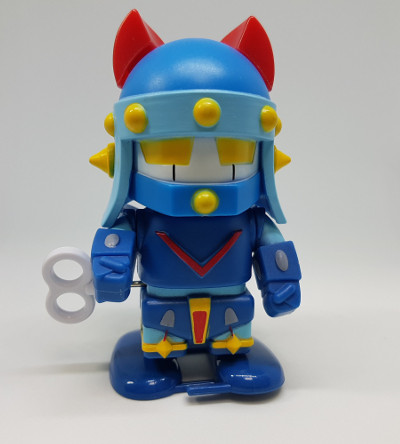

CORREL    	img1:   1.00	img2:   0.70	img3:   0.56	img4:   0.23	
CHISQR    	img1:   0.00	img2:  67.33	img3:  35.71	img4:1129.49	
INTERSECT 	img1:   1.00	img2:   0.54	img3:   0.40	img4:   0.18	
BHATTACHARYYA	img1:   0.00	img2:   0.48	img3:   0.47	img4:   0.79	


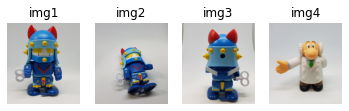

In [ ]:
import cv2, numpy as np
import matplotlib.pylab as plt
from google.colab.patches import cv2_imshow

img1 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/taekwonv1.jpg')
img2 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/taekwonv2.jpg')
img3 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/taekwonv3.jpg')
img4 = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/dr_ochanomizu.jpg')

cv2_imshow( img1)
imgs = [img1, img2, img3, img4]
hists = []
for i, img in enumerate(imgs) :
    plt.subplot(1,len(imgs),i+1)
    plt.title('img%d'% (i+1))
    plt.axis('off') 
    plt.imshow(img[:,:,::-1])
    #---① 각 이미지를 HSV로 변환
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    #---② H,S 채널에 대한 히스토그램 계산
    hist = cv2.calcHist([hsv], [0,1], None, [180,256], [0,180,0, 256])
    #---③ 0~1로 정규화
    cv2.normalize(hist, hist, 0, 1, cv2.NORM_MINMAX)
    hists.append(hist)


query = hists[0]
methods = {'CORREL' :cv2.HISTCMP_CORREL, 'CHISQR':cv2.HISTCMP_CHISQR, 
           'INTERSECT':cv2.HISTCMP_INTERSECT,
           'BHATTACHARYYA':cv2.HISTCMP_BHATTACHARYYA}
for j, (name, flag) in enumerate(methods.items()):
    print('%-10s'%name, end='\t')
    for i, (hist, img) in enumerate(zip(hists, imgs)):
        #---④ 각 메서드에 따라 img1과 각 이미지의 히스토그램 비교
        ret = cv2.compareHist(query, hist, flag)
        if flag == cv2.HISTCMP_INTERSECT: #교차 분석인 경우 
            ret = ret/np.sum(query)        #비교대상으로 나누어 1로 정규화
        print("img%d:%7.2f"% (i+1 , ret), end='\t')
    print()
plt.show()

［예제 4-33］의 코드 ①，②，③은 각 영상을 HSV 컬러 스페이스로 바꾸고 H와 V에 
대해 2차원 히스토그램을 계산해서 0 ~ 1로 노멀라이즈합니다. 코드 ④에서 각각 
의 비교 알고리즘을 이용해서 각 영상을 차례대로 비교합니다. 이때 cv2.HISTCMP_ 
INT대SECT인 경우 비교 원본의 히스토그램으로 나누기를 하면 0 ~ 1로 노멀라이즈할 
수 있고 그러면 결과를 판별하기가 편리합니다.
img1과의 비교 결과는 모두 완전 일치를 보여주고 있으며，img4의 경우 가장 멀어 
진 값으로 나타나는 것을 확인할 수 있습니다.


##4.6 실전 워크숍
실전 워크숍에서는 이 장에서 다룬 이미지 프로세싱의 기초적인 개념과 이미지 연산 
방법들을 직접 연습해 볼 수 있습니다. 단편적으로 다룬 내용들을 종합적으로 적용 
해 보면서 익힐 수 있도록 과제를 제시합니다. 독자 여러분께서는 필자의 풀이에 의 
존하지 말고 직접 프로그래밍해 보면서 완성해 나가길 바랍니다.


###4.6.1 반해골 괴물 얼굴 합성
판타지 영화에서 악당 얼굴의 반은 정상인데 나머지 반은 괴물인 장면을 한번쯤 본 
적이 있을 것입니다. 아래와 같이 영상 2개를 합성해서 반은 정상이고 반은 해골인 
괴물 얼굴을 어색하지 않게 만들어 보세요

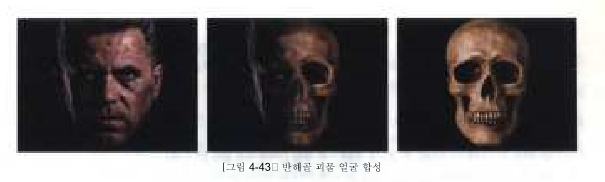

［사용 파일］
• 얼굴 영상: img/man_face.jpg
• 해골 영상: img/skull.jpg
［힌트］
두 영상의 절반씩 가져다가 새로운 영상을 단순히 합성하면 그냥 두 개의 영상을 
이어 붙인 것처럼 보여서 어색합니다. 두 영상이 만나는 지점의 일정 부분올 알파 
값이 서서히 변하게 알파 블렌딩하면 자연스럽게 두 개의 얼굴이 하나의 얼굴로 
합성됩니다. 알파 값은 블렌딩의 시작 지점은 1:0, 중간 지점은 0.5:0.5, 끝 지점은 
0:1이 되게 합니다.
［풀이］
［예제 4-34］ 반해골 괴물 얼굴 합성 풀이


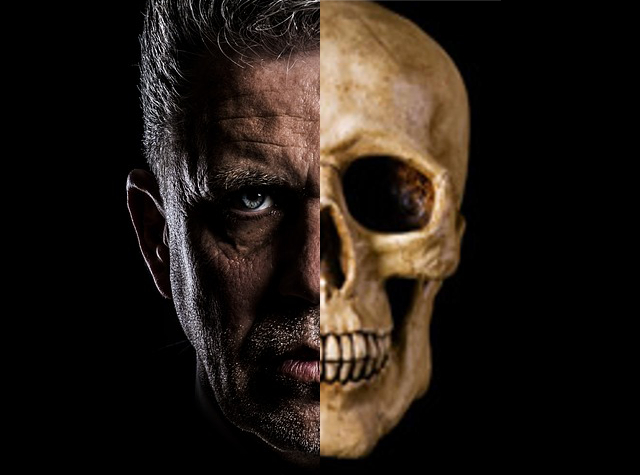

0 1.0 0.0
1 0.9895833333333333 0.01041666666666674
2 0.9791666666666667 0.02083333333333326
3 0.96875 0.03125
4 0.9583333333333333 0.04166666666666674
5 0.9479166666666667 0.05208333333333326
6 0.9375 0.0625
7 0.9270833333333333 0.07291666666666674
8 0.9166666666666667 0.08333333333333326
9 0.90625 0.09375
10 0.8958333333333333 0.10416666666666674
11 0.8854166666666667 0.11458333333333326
12 0.875 0.125
13 0.8645833333333333 0.13541666666666674
14 0.8541666666666667 0.14583333333333326
15 0.84375 0.15625
16 0.8333333333333333 0.16666666666666674
17 0.8229166666666665 0.17708333333333348
18 0.8125 0.1875
19 0.8020833333333333 0.19791666666666674
20 0.7916666666666665 0.20833333333333348
21 0.78125 0.21875
22 0.7708333333333333 0.22916666666666674
23 0.7604166666666665 0.23958333333333348
24 0.75 0.25
25 0.7395833333333333 0.26041666666666674
26 0.7291666666666665 0.2708333333333335
27 0.71875 0.28125
28 0.7083333333333333 0.29166666666666674
29 0.6979166666666665 0.3020833333333335
30 0

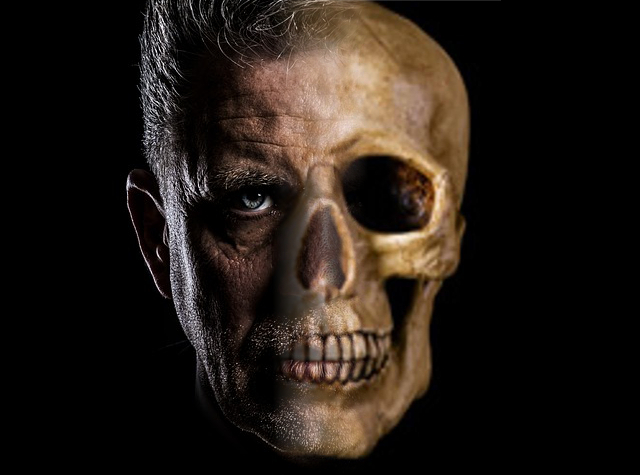

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# 영상의 15%를 알파 블렌딩의 범위로 지정
alpha_width_rate = 15

# 합성할 두 영상 읽기
img_face = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/man_face.jpg')
img_skull = cv2.imread('/content/drive/MyDrive/openCV/insightbook.opencv_project_python-master/insightbook.opencv_project_python-master/img/skull.jpg')

# 입력 영상과 같은 크기의 결과 영상 준비
img_comp = np.zeros_like(img_face)

# 연산에 필요한 좌표 계산
height, width = img_face.shape[:2]
middle = width//2                             # 영상의 중앙 좌표
alpha_width = width * alpha_width_rate // 100 # 알파 블렌딩 범위
start = middle - alpha_width//2               # 알파 블렌딩 시작 지점
step = 100/alpha_width                        # 알파 값 간격

# 입력 영상의 절반씩 복사해서 결과 영상에 합성
img_comp[:, :middle, : ] = img_face[:, :middle, :].copy()
img_comp[:, middle:, :] = img_skull[:, middle:, :].copy()
cv2_imshow( img_comp)

# 알파 값을 바꾸면서 알파 블렌딩 적용
for i in range(alpha_width+1 ):
    alpha = (100 - step * i) / 100  # 증감 간격에 따른 알파 값 (1~0)
    beta = 1 - alpha                # 베타 값 (0~1)
    # 알파 블렌딩 적용
    img_comp[:, start+i] = img_face[:, start+i] * \
                                alpha + img_skull[:, start+i] * beta
    print(i, alpha, beta)
    
cv2_imshow( img_comp)
cv2.waitKey()
cv2.destroyAllWindows()

###4.6.2 모션 감지 CCTV
카메라 영상의 차영상으로 움직임을 감지하고 움직임 이 있는 영 역을 표시하는 프로 
그램을 만들어 보세요.


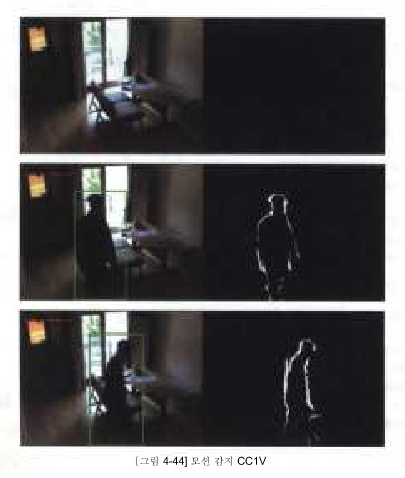

［힌트］
Project —
이전과 이후의 두 프레임 영상에서 단순히 차이를 구해서는 움직임을 감지할 수 
없습니다. 카메라를 고정한 책상이나 건물이 미세하게 떨리기도 하고 카메라식 
이미지 센서(CCD)의 한계 때문에 영상 간의 차이는 반드시 항상 발생합니다. 따 
라서 세 프레임 a, b, c를 순차적으로 얻어서 a와 b의 차이 그리고 b와 c의 차이가 
모두 발견되는 경우에 한해서 움직임이 있는 것으로 판단해야 합니다.
이때 각 프레임의 차이가 특정 기준치보다 작은 픽셀은 무시하고 차이가 없는 
것으로 간주합니다. 이렇게 해서 최종적으로 차이가 있는 것으로 판단한 픽셀의 
개수가 특정 기준치보다 많은 경우에 움직임이 있는 것으로 간주합니다.
기준치 두 가지는 설치된 환경과 카메라의 품질에 따라 조정할 수 있도록 합 
니다.
［풀이］
［예제 4-35) 모션 감지 CCTV 풀이

In [ ]:
import cv2
import numpy as np

# 감도 설정(카메라 품질에 따라 조정 필요)
thresh = 25    # 달라진 픽셀 값 기준치 설정
max_diff = 5   # 달라진 픽셀 갯수 기준치 설정

# 카메라 캡션 장치 준비
a, b, c = None, None, None
cap = cv2.VideoCapture(0)
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 480)      # 프레임 폭을 480으로 설정 
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 320)     # 프레임 높이를 320으로 설정

if cap.isOpened():
    ret, a = cap.read()         # a 프레임 읽기
    ret, b = cap.read()         # b 프레임 읽기

    while ret:
        ret, c = cap.read()     # c 프레임 읽기
        draw = c.copy()         # 출력 영상에 사용할 복제본
        if not ret:
            break
        
        # 3개의 영상을 그레이 스케일로 변경
        a_gray = cv2.cvtColor(a, cv2.COLOR_BGR2GRAY)
        b_gray = cv2.cvtColor(b, cv2.COLOR_BGR2GRAY)
        c_gray = cv2.cvtColor(c, cv2.COLOR_BGR2GRAY)

        # a-b, b-c 절대 값 차 구하기 
        diff1 = cv2.absdiff(a_gray, b_gray)
        diff2 = cv2.absdiff(b_gray, c_gray)

        # 스레시홀드로 기준치 이내의 차이는 무시
        ret, diff1_t = cv2.threshold(diff1, thresh, 255, cv2.THRESH_BINARY)
        ret, diff2_t = cv2.threshold(diff2, thresh, 255, cv2.THRESH_BINARY)

        # 두 차이에 대해서 AND 연산, 두 영상의 차이가 모두 발견된 경우
        diff = cv2.bitwise_and(diff1_t, diff2_t)

        # 열림 연산으로 노이즈 제거 ---①
        k = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,3))
        diff = cv2.morphologyEx(diff, cv2.MORPH_OPEN, k)

        # 차이가 발생한 픽셀이 갯수 판단 후 사각형 그리기
        diff_cnt = cv2.countNonZero(diff)
        if diff_cnt > max_diff:
            nzero = np.nonzero(diff)  # 0이 아닌 픽셀의 좌표 얻기(y[...], x[...])
            cv2.rectangle(draw, (min(nzero[1]), min(nzero[0])), \
                                (max(nzero[1]), max(nzero[0])), (0,255,0), 2)
            cv2.putText(draw, "Motion Detected", (10,30), \
                                cv2.FONT_HERSHEY_DUPLEX, 0.5, (0,0,255))
        
        # 컬러 스케일 영상과 스레시홀드 영상을 통합해서 출력
        stacked = np.hstack((draw, cv2.cvtColor(diff, cv2.COLOR_GRAY2BGR)))
        cv2.imshow('motion sensor',stacked )

        # 다음 비교를 위해 영상 순서 정리
        a = b
        b = c
        
        if cv2.waitKey(1) & 0xFF == 27:
            break                

코드 ①은 미세한 노이즈 때문에 움직임 영 역을 정확히 추출할 수 없어서 추가한 코 
드로，6장 “영상 필터”에서 자세히 다룹니다. 해당 부분이 없어도 움직임을 검출하는 
데는 문제가 없습니다.
